In [1]:
#Common DS Libraries:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

#Stats Libraries
import scipy.stats as stats

#Modeling
from sklearn.cluster import KMeans
from itertools import combinations
from sklearn.feature_selection import SelectKBest, f_regression, RFE, RFECV
from sklearn.linear_model import LinearRegression, LassoLars, TweedieRegressor
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures, MinMaxScaler

#Ignore Warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
import acquire
from wrangle import full_wrangle

In [3]:
# Creates DataFrame from SQL query, or from CSV created when first acquired
df = acquire.get_zillow_data()
df, X_train_exp, X_train, y_train, X_validate, y_validate, X_test, y_test = full_wrangle(df)
df.info()

Features removed: 
['parcelid', 'id', 'id.1', 'airconditioningtypeid', 'architecturalstyletypeid', 'basementsqft', 'bathroomcnt', 'buildingclasstypeid', 'buildingqualitytypeid', 'decktypeid', 'finishedfloor1squarefeet', 'finishedsquarefeet12', 'finishedsquarefeet13', 'finishedsquarefeet15', 'finishedsquarefeet50', 'finishedsquarefeet6', 'fireplacecnt', 'fullbathcnt', 'garagecarcnt', 'garagetotalsqft', 'hashottuborspa', 'heatingorsystemtypeid', 'poolcnt', 'poolsizesum', 'pooltypeid10', 'pooltypeid2', 'pooltypeid7', 'propertylandusetypeid', 'propertyzoningdesc', 'rawcensustractandblock', 'regionidcity', 'regionidcounty', 'regionidneighborhood', 'regionidzip', 'roomcnt', 'storytypeid', 'threequarterbathnbr', 'typeconstructiontypeid', 'unitcnt', 'yardbuildingsqft17', 'yardbuildingsqft26', 'numberofstories', 'fireplaceflag', 'assessmentyear', 'taxdelinquencyflag', 'taxdelinquencyyear', 'censustractandblock', 'logerror.1', 'transactiondate.1']

-----
Columns reduced by 30 to 34, and rows red

## Feature Engineering

The first feature is absolute logerror, which I will added to the dataframe already.

The next captures any differences between structure and land values for total sales value.

In [4]:
df['structure_value_ratio'] = df.structurevalue/df.salesvalue

Finally, I decided to replace regionidcity (with 175 categorical entries) and then redfine cluster based on average sales price within that cluster.

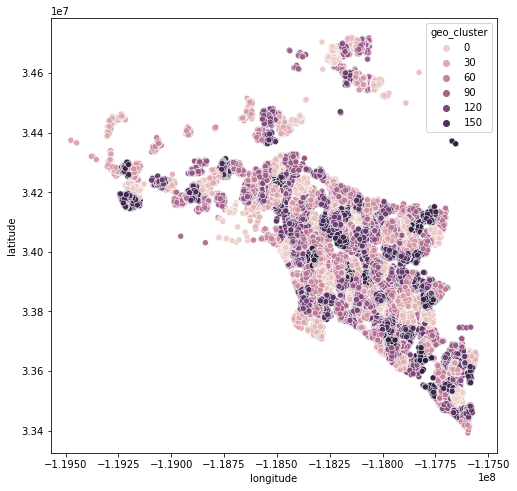

In [5]:
kmeans = KMeans(n_clusters = 175)
kmeans.fit(df[['latitude','longitude']])
df['geo_cluster'] = kmeans.predict(df[['latitude','longitude']])
plt.figure(figsize = (8,8))
sns.scatterplot(data = df, x = df.longitude, y = df.latitude, hue='geo_cluster')
plt.show()

In [6]:
df.head()

,transactiondate,bedrooms,bathrooms,sqft,county,latitude,longitude,lotsize,landusecode,yearbuilt,...,landusecode_0108,landusecode_0109,landusecode_010G,landusecode_010M,landusecode_0131,landusecode_1,landusecode_1110,landusecode_1111,landusecode_122,geo_cluster
0,2017-01-01,4,3.5,3100,Orange,33634931.0,-117869207.0,4506,122,1998,...,0,0,0,0,0,0,0,0,1,118
1,2017-01-02,3,2.5,3011,Orange,33628725.0,-117873172.0,6944,122,1973,...,0,0,0,0,0,0,0,0,1,118
2,2017-01-03,4,2.5,2303,Orange,33638599.0,-117873264.0,10011,122,1964,...,0,0,0,0,0,0,0,0,1,118
3,2017-01-05,3,2.5,3512,Orange,33633496.0,-117867052.0,7590,122,1998,...,0,0,0,0,0,0,0,0,1,118
4,2017-01-05,4,3.0,2096,Orange,33642306.0,-117879913.0,2592,122,1971,...,0,0,0,0,0,0,0,0,1,118


In [7]:
geo_clusters = pd.DataFrame(df.groupby('geo_cluster').salesvalue.mean().sort_values())
geo_clusters = geo_clusters.rename(columns = {'salesvalue':'geo_sales_value'})
geo_clusters

,geo_sales_value
geo_cluster,
23,126255.124051
44,137220.875000
98,158163.830677
93,161075.931548
95,165262.400000
...,...
118,721484.506912
160,739613.115385
141,754359.968153


In [8]:
scaler = MinMaxScaler()
scaler.fit(geo_clusters)

# Fit the data
geo_clusters = pd.DataFrame(scaler.transform(geo_clusters),columns=geo_clusters.columns.values).set_index([geo_clusters.index.values])
geo_clusters['geo_cluster'] = geo_clusters.index
geo_clusters

,geo_sales_value,geo_cluster
23,0.000000,23
44,0.017166,44
98,0.049951,98
93,0.054510,93
95,0.061063,95
...,...,...
118,0.931793,118
160,0.960173,160
141,0.983258,141
89,0.987725,89


In [9]:
# df.merge default settings for commonly used parameters.
df = df.merge(geo_clusters, how='inner', on='geo_cluster')
df = df.drop(columns = ['geo_cluster'])

# IV. First EDA  (next: Cluster Examination)

Time to split the data.

In [10]:
from splitter import splitter

In [11]:
train, validate, test = splitter(df)

Train = 25463 rows (56.0%) | Validate = 10913 rows (24.0%) | Test = 9095 rows (20.0%)
You did not stratify.  If looking to stratify, ensure to add argument: "target = variable to stratify on".


#### I will now run so bivariate charts comparing the different features with the target variable, logerror

In [12]:
import explore

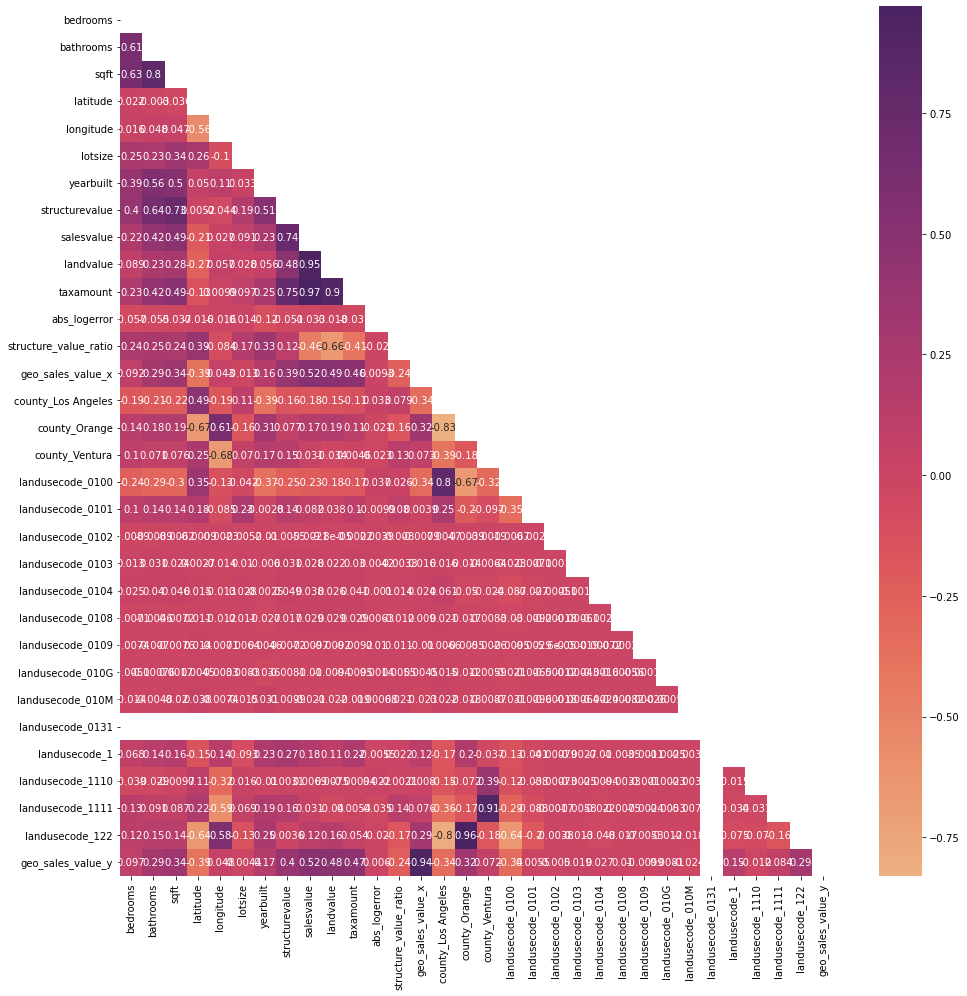

In [13]:
num_cols = [col for col in train.columns if train[col].dtype != 'object']
cat_cols = [col for col in train.drop(columns='transactiondate').columns if train[col].dtype == 'object']

# Create a correlation matrix from the continuous numerical columns
train_num_cols = train[num_cols]
corr = train_num_cols.corr()

# Pass correlation matrix on to sns heatmap
plt.figure(figsize=(16,16))
sns.heatmap(corr, annot=True, cmap="flare", mask=np.triu(corr))
plt.show()

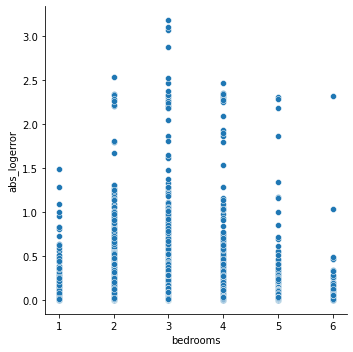

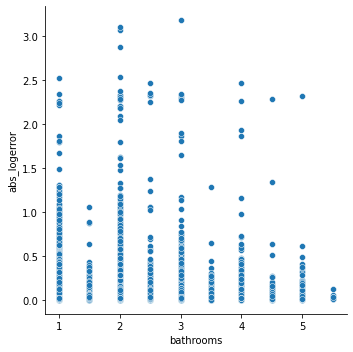

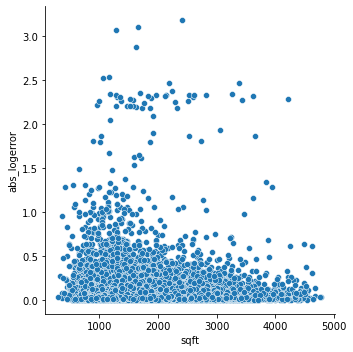

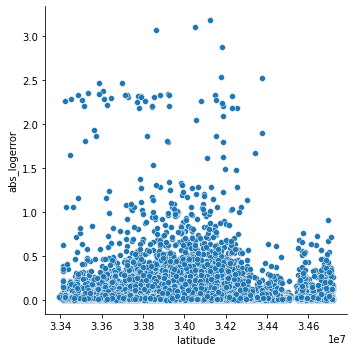

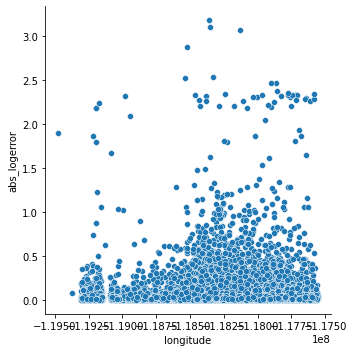

...

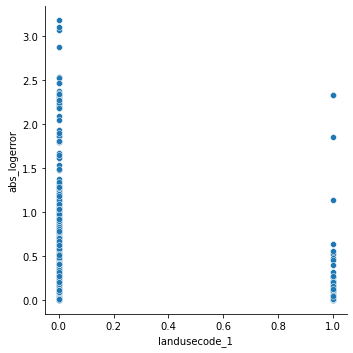

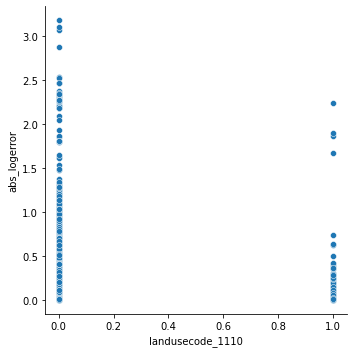

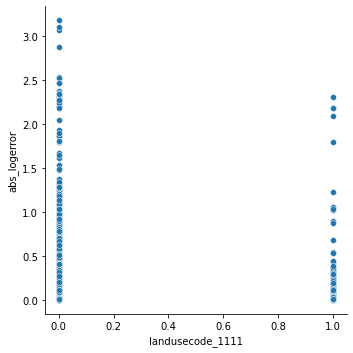

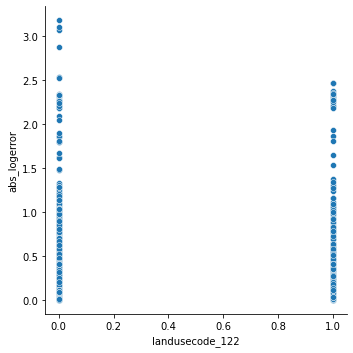

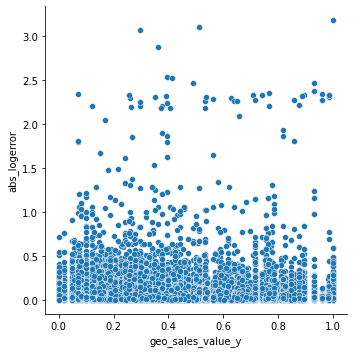

In [14]:
for i in num_cols:
    sns.relplot(data = train, x=i, y='abs_logerror')
    plt.show()

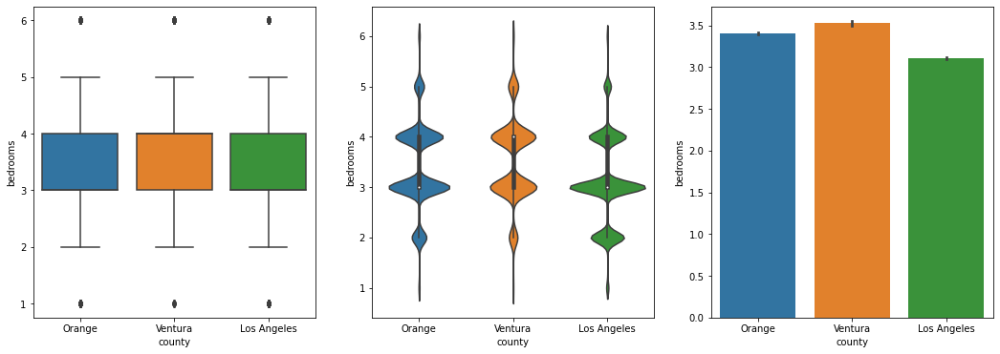

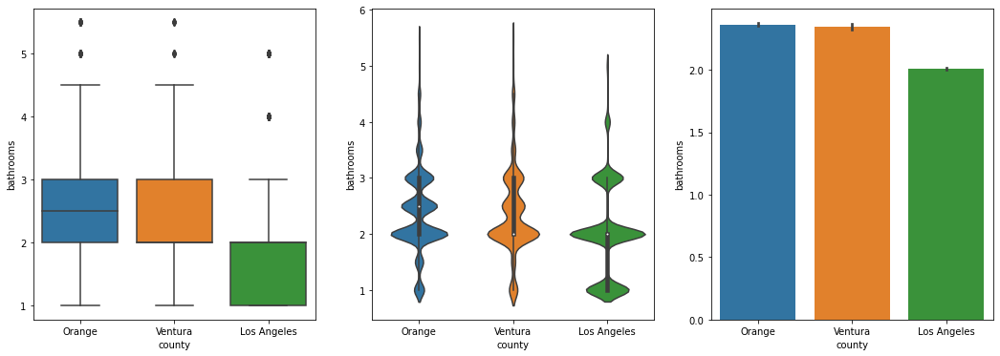

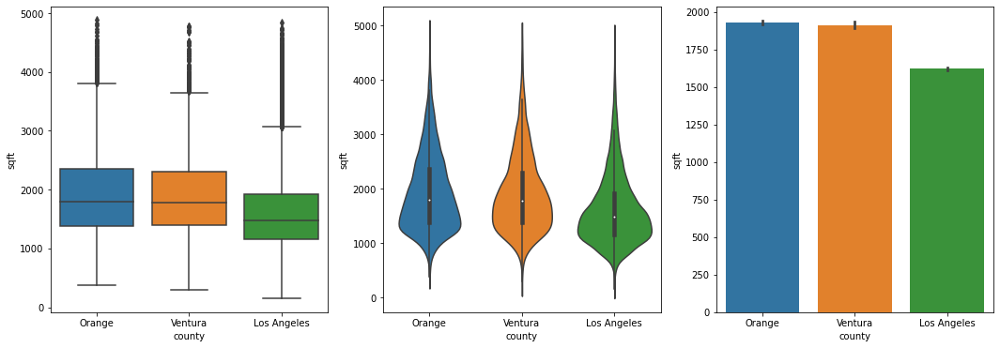

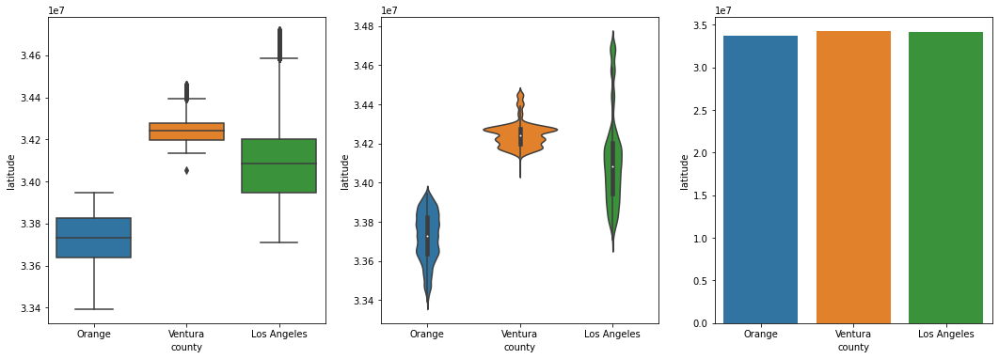

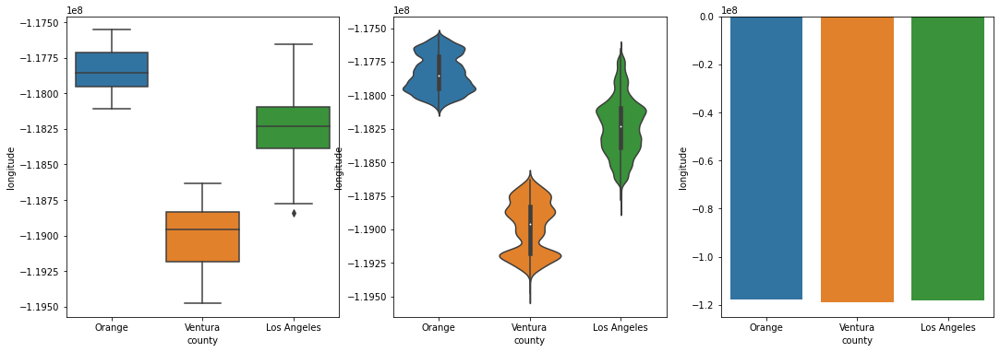

...

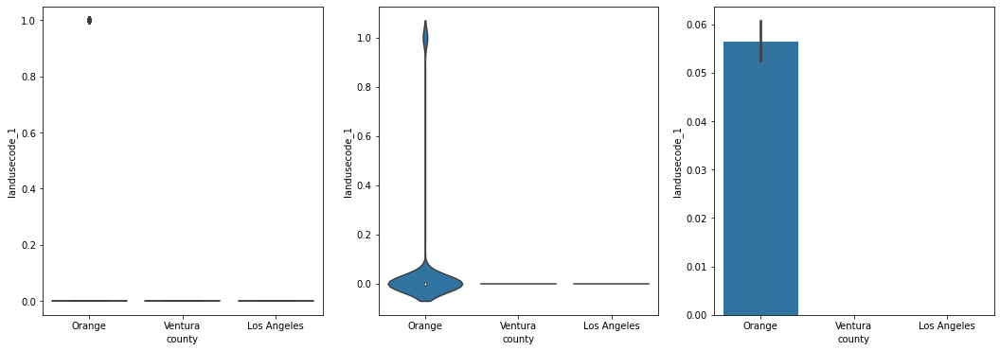

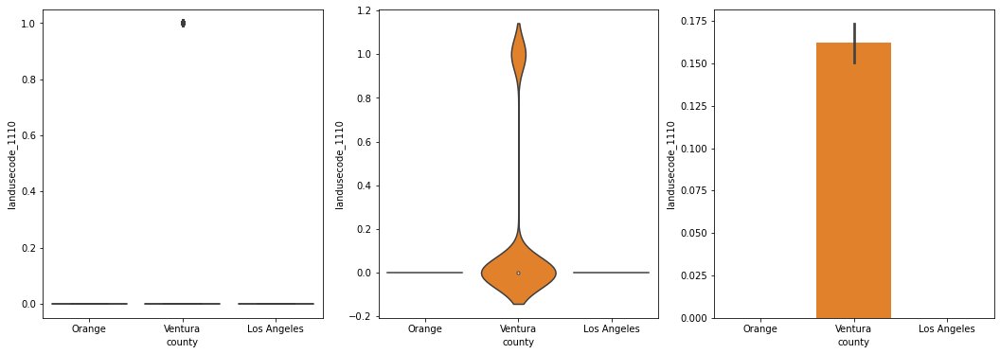

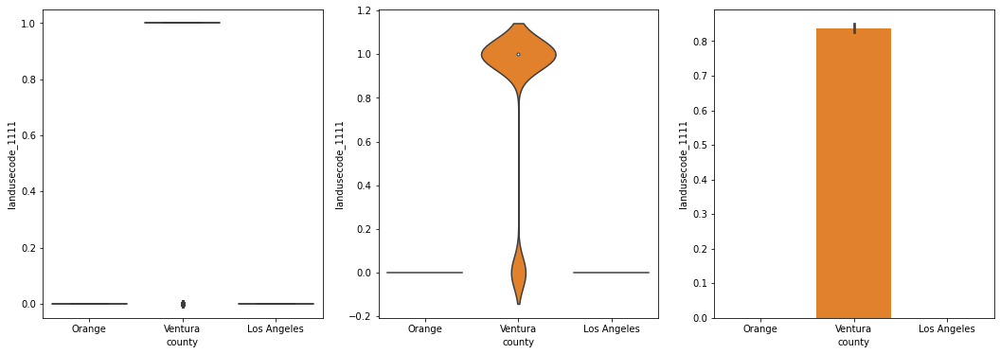

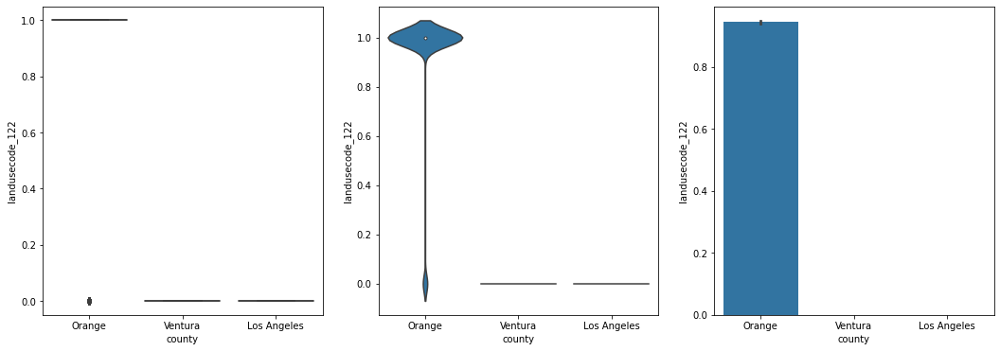

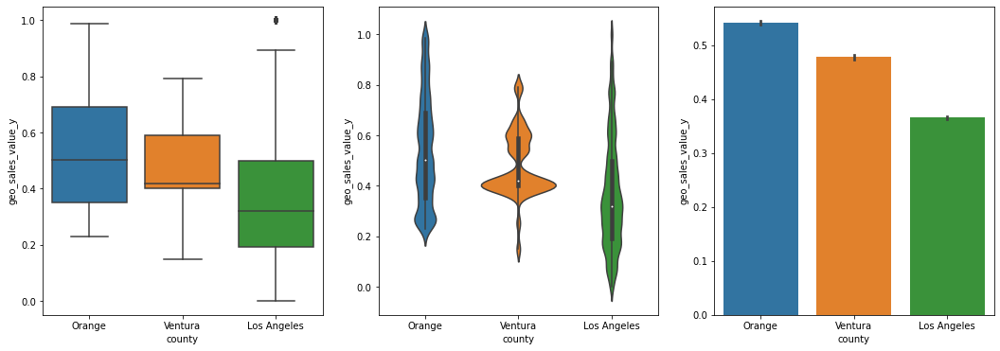

In [15]:
for i in num_cols:
    plt.figure(figsize = (18,6))
    plt.subplot(1,3,1)
    sns.boxplot(data = df, x=cat_cols[0], y=i)
    plt.subplot(1,3,2)
    sns.violinplot(data = df, x=cat_cols[0], y=i)
    plt.subplot(1,3,3)
    sns.barplot(data = df, x=cat_cols[0], y=i)
    plt.show()

Did this with the citycode thing and it was a mess.  So took it out.

# Question: I notice I have a lot of slightly different values for things - like 5 types of bathroom counts and three property land values.  And the data originally coming in from the SQL query, much of it had a lot of slightly different types of numbers.  So maybe one is a better predictor.
## Do land and building value have the same mean logerrors?  Can we use them to cluster things?
## How about bathrooms.

##### Sensitive to outliers, which is why I so agressively cut them out.

# Clustering Analysis #2

In [16]:
features = list(df.columns)

In [17]:
features_to_remove = ['abs_logerror','latitude','bedrooms','bathrooms','fullbaths','longitude','landusecode_0131',
 'landusecode_010G', 'landusecode_0102', 'landusecode_010M','landusecode_0109', 'landusecode_122', 'landusecode_0103',
 'landusecode_0109', 'transactiondate', 'county_Los Angeles',
 'county_Orange', 'landusecode_1110',
 'landusecode_0101','landusecode',
 'landusecode_0108',
 'county_Ventura',
 'county',
 'landusecode_1',
 'landusecode_1111',
 'landusecode_0100',
 'landusecode_0104']
features = list(set(features)-set(features_to_remove))
features

['salesvalue',
 'geo_sales_value_y',
 'structurevalue',
 'geo_sales_value_x',
 'taxamount',
 'sqft',
 'lotsize',
 'landvalue',
 'yearbuilt',
 'structure_value_ratio']

This was done on train!!!

In [18]:
df_to_scale2 = train[features]
scaler = MinMaxScaler()
scaler.fit(df_to_scale2)

# Fit the data
df_clustering2 = pd.DataFrame(scaler.transform(df_to_scale2),columns=df_to_scale2.columns.values).set_index([df_to_scale2.index.values])
df_clustering2.head(2)

,salesvalue,geo_sales_value_y,structurevalue,geo_sales_value_x,taxamount,sqft,lotsize,landvalue,yearbuilt,structure_value_ratio
42213,0.422785,0.888728,0.484305,0.841998,0.416147,0.476381,0.379319,0.336134,0.890511,0.416787
19936,0.626602,0.818651,0.579648,0.713502,0.565266,0.747772,0.465388,0.564389,0.810219,0.336950


----------

 salesvalue vs logerror clustering:



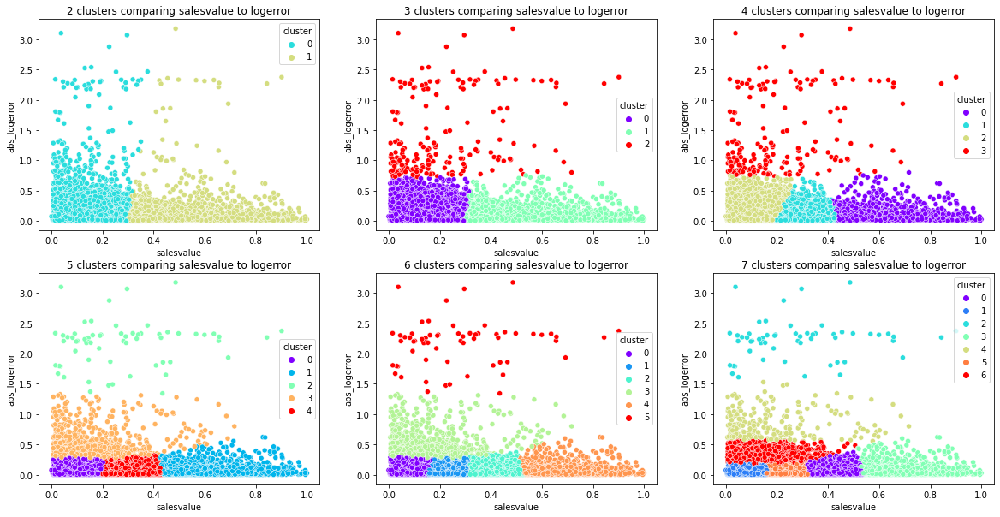

----------

 geo_sales_value_y vs logerror clustering:



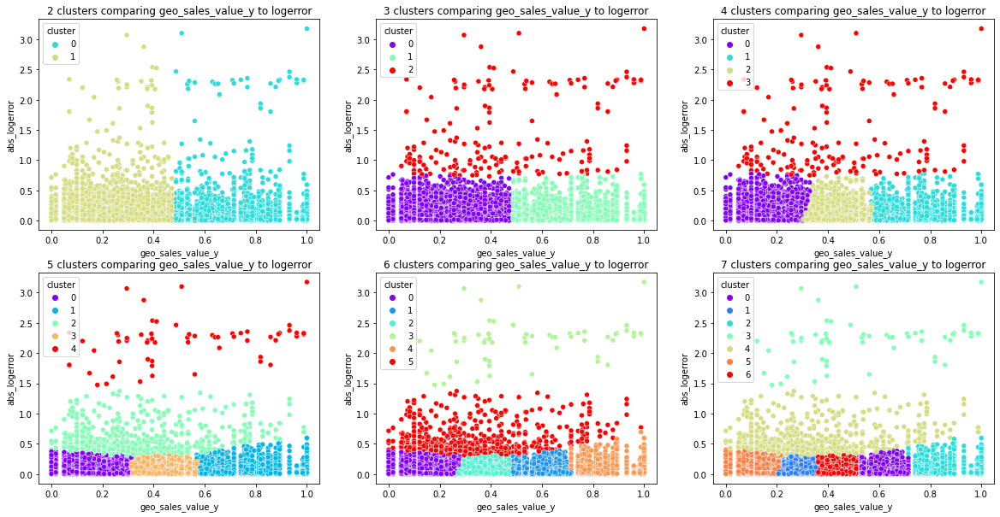

----------

 structurevalue vs logerror clustering:



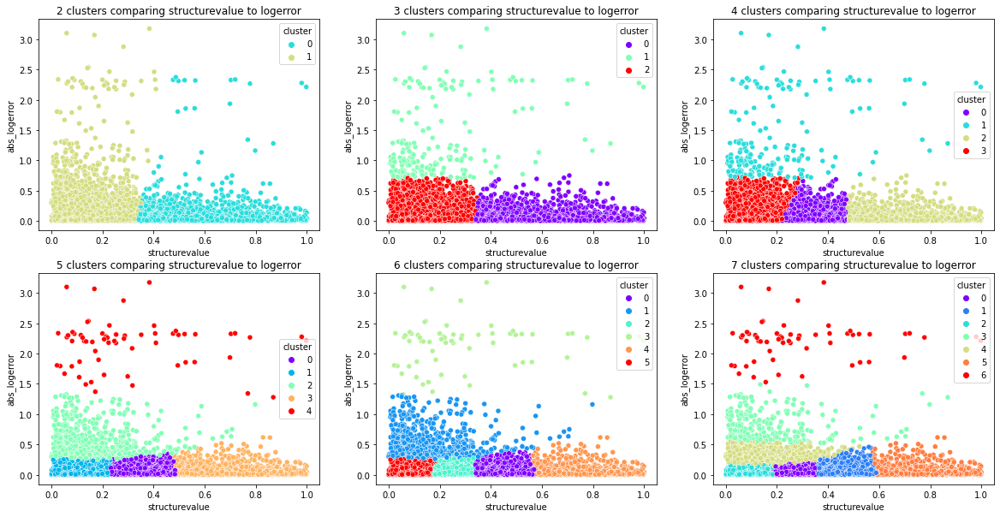

----------

 geo_sales_value_x vs logerror clustering:



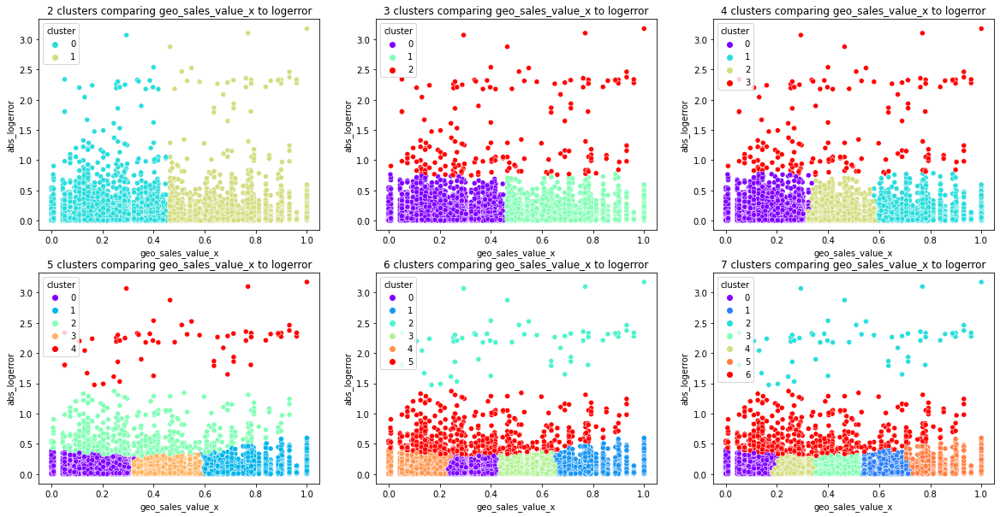

----------

 taxamount vs logerror clustering:



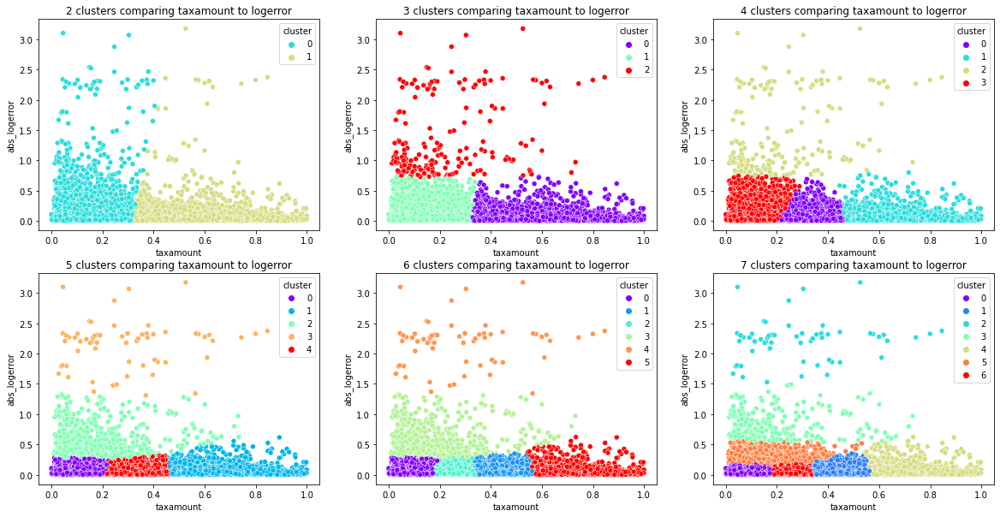

----------

 sqft vs logerror clustering:



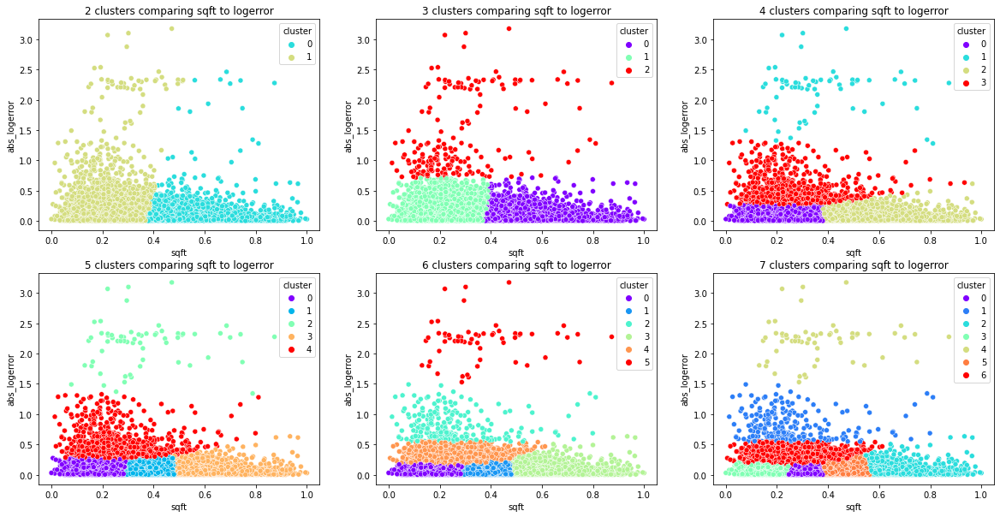

----------

 lotsize vs logerror clustering:



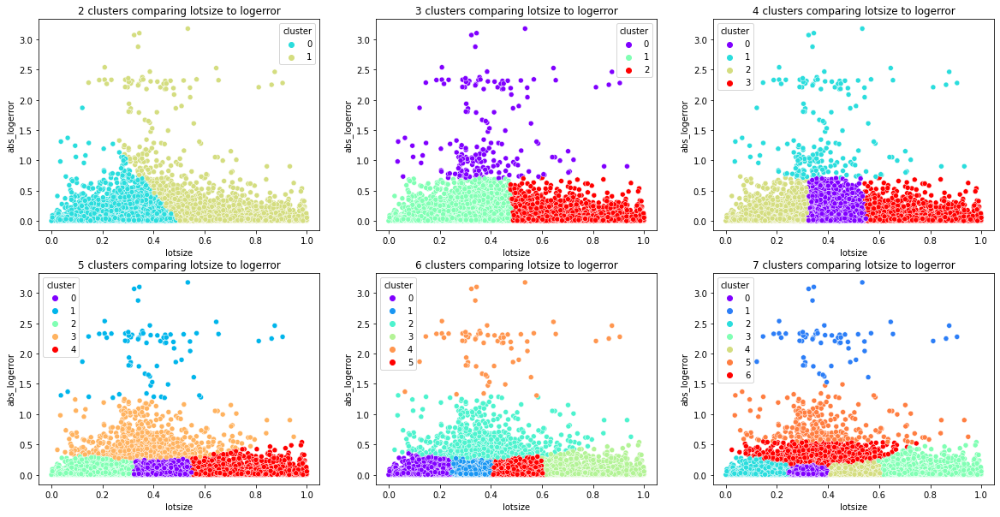

----------

 landvalue vs logerror clustering:



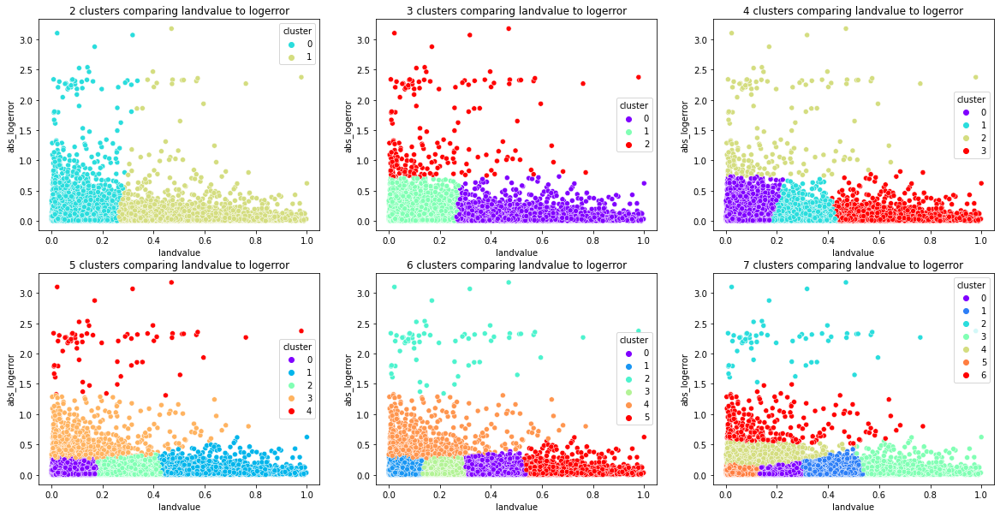

----------

 yearbuilt vs logerror clustering:



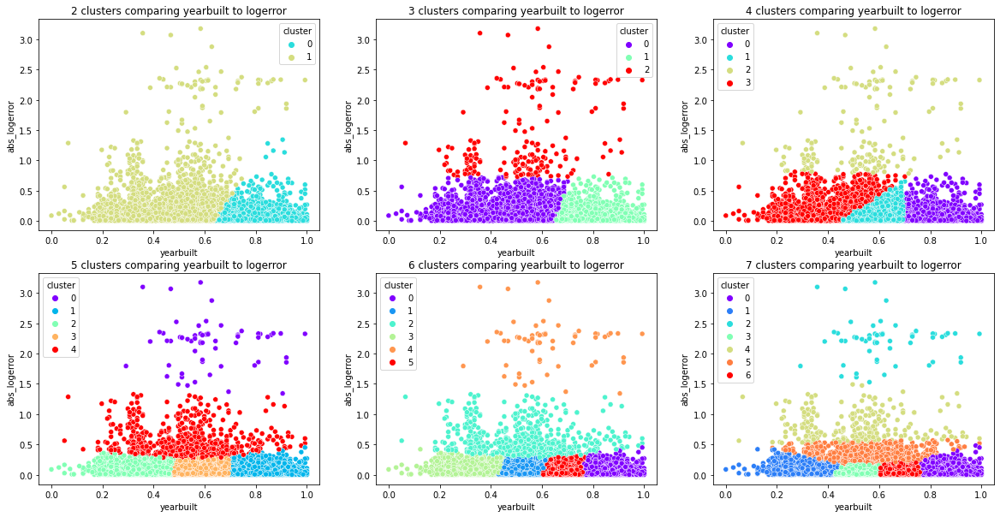

----------

 structure_value_ratio vs logerror clustering:



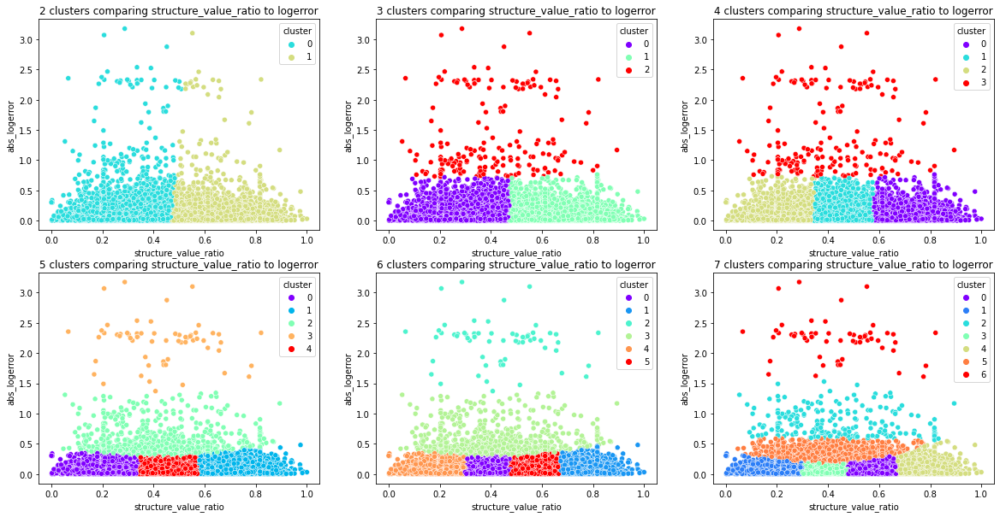

In [19]:
for col in df_clustering2.columns:
    print(f'----------\n\n {col} vs logerror clustering:\n')
    plt.figure(figsize = (20,10))
    for k in range(2,8):
        plt.subplot(2,3,k-1)
        cluster = pd.concat([df_clustering2[col],train.abs_logerror],axis=1)
        kmeans = KMeans(n_clusters = k)
        kmeans.fit(cluster)
        cluster['cluster'] = kmeans.predict(cluster)       
        plt.title(f'{k} clusters comparing {col} to logerror')
        sns.scatterplot(data = cluster, x = cluster[col], y = train.abs_logerror, hue='cluster', palette='rainbow')
        cluster = cluster.drop(columns='cluster')
    plt.show()

----------

 salesvalue vs logerror clustering:



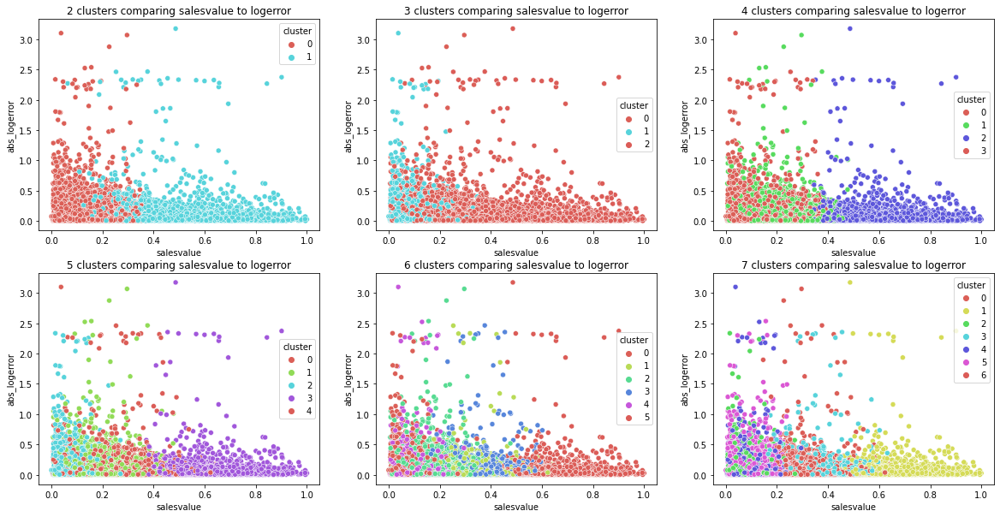

----------

 geo_sales_value_y vs logerror clustering:



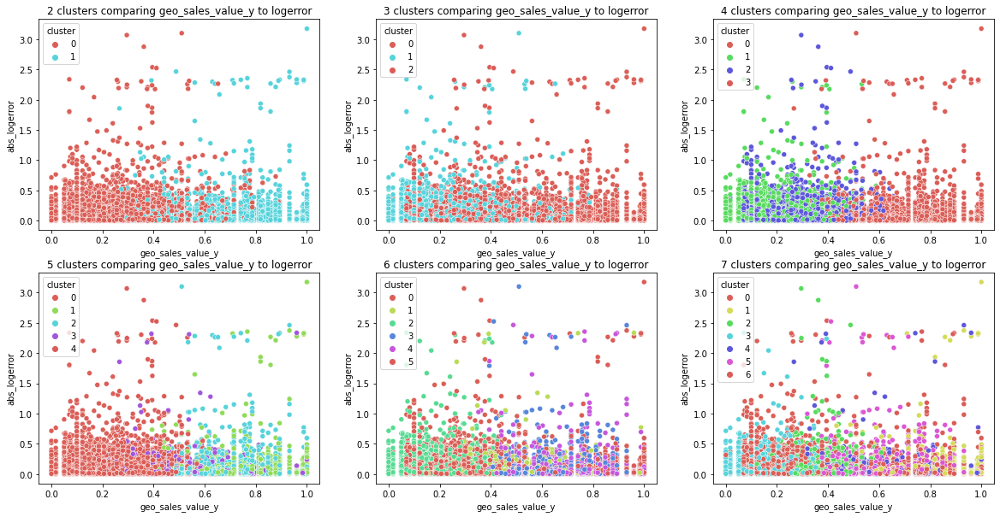

----------

 structurevalue vs logerror clustering:



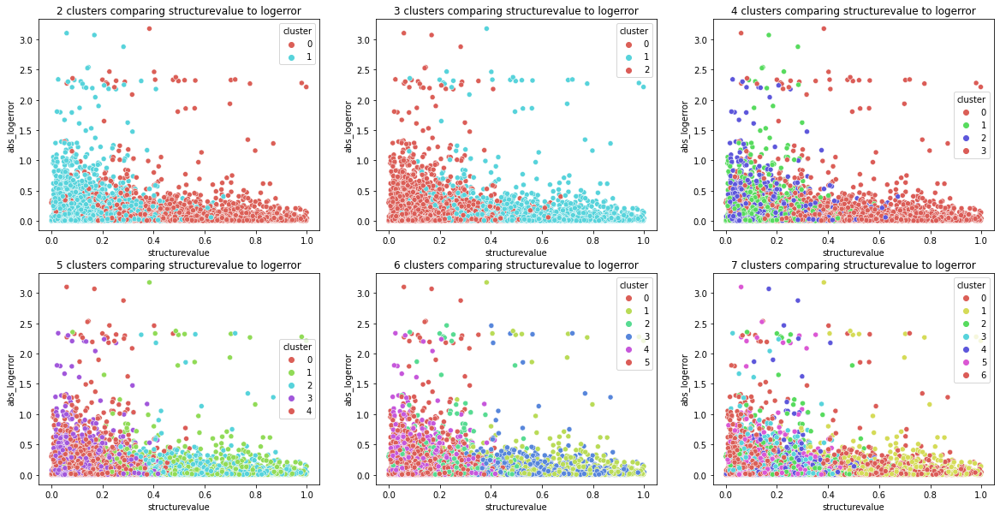

----------

 geo_sales_value_x vs logerror clustering:



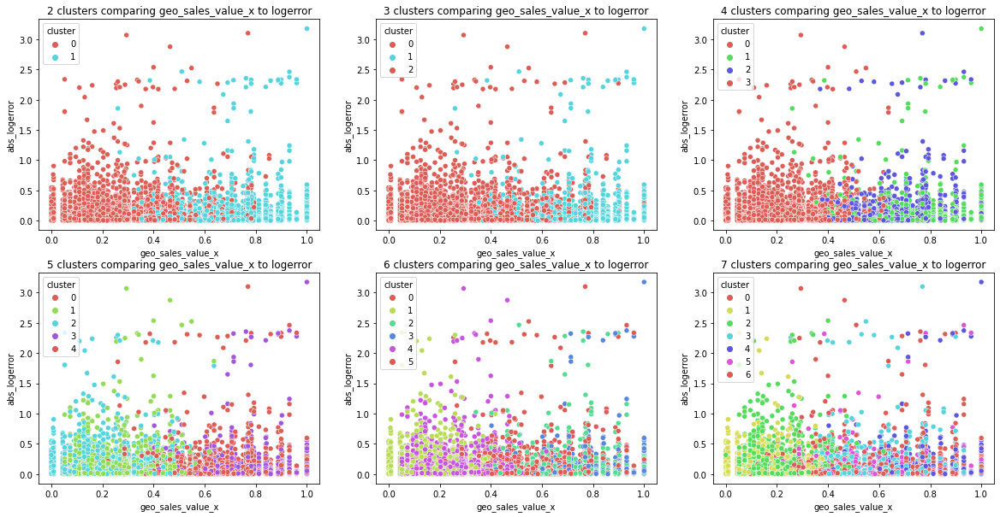

----------

 taxamount vs logerror clustering:



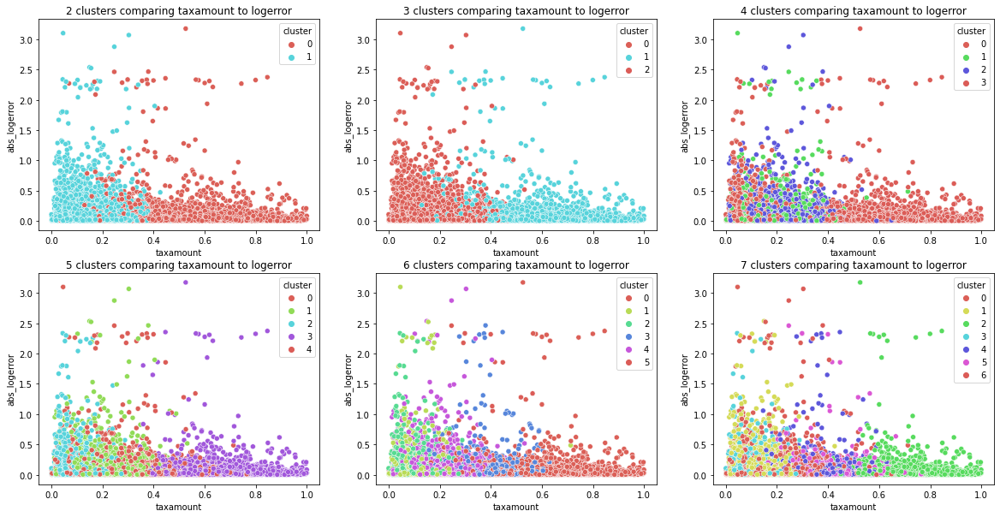

----------

 sqft vs logerror clustering:



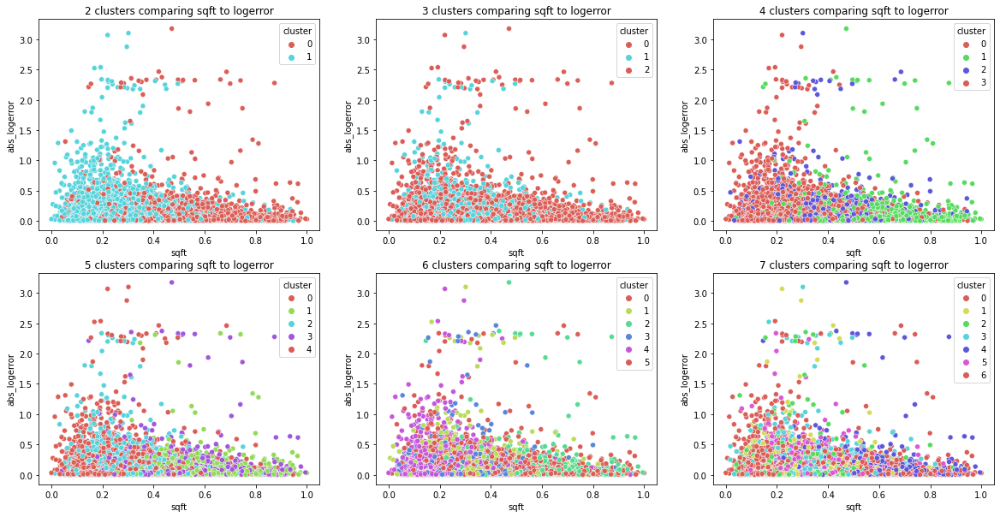

----------

 lotsize vs logerror clustering:



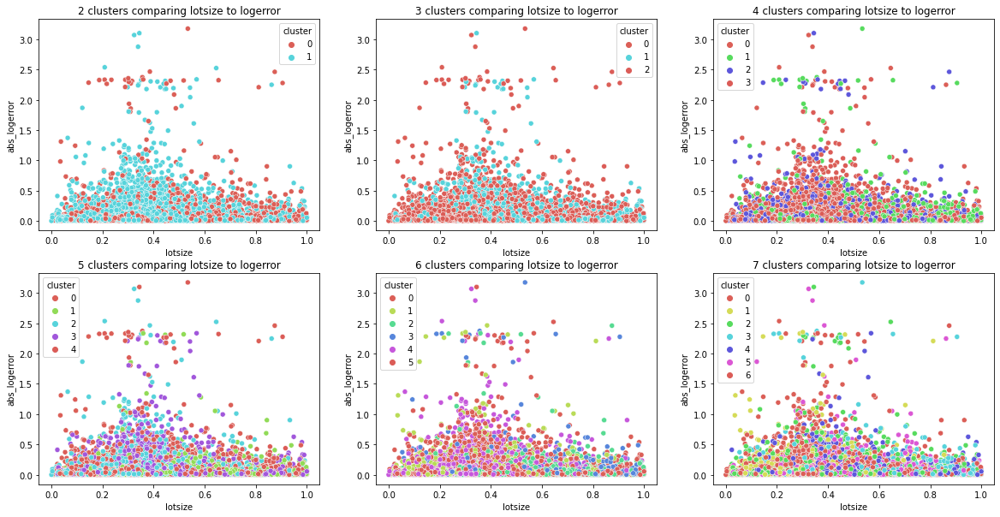

----------

 landvalue vs logerror clustering:



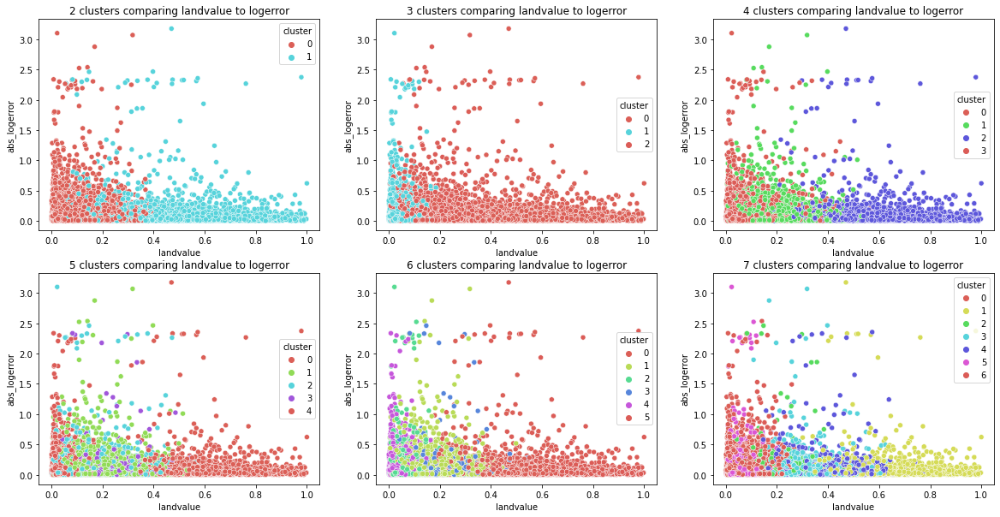

----------

 yearbuilt vs logerror clustering:



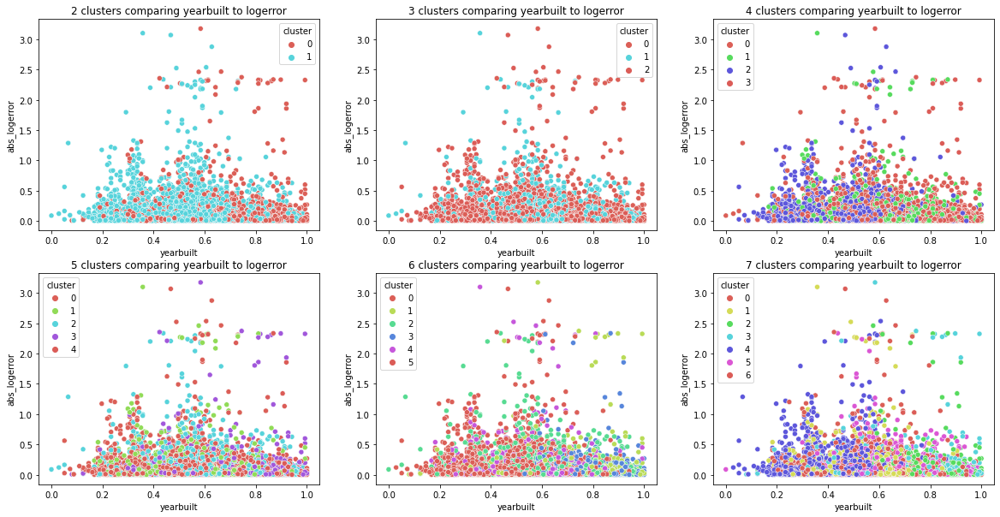

----------

 structure_value_ratio vs logerror clustering:



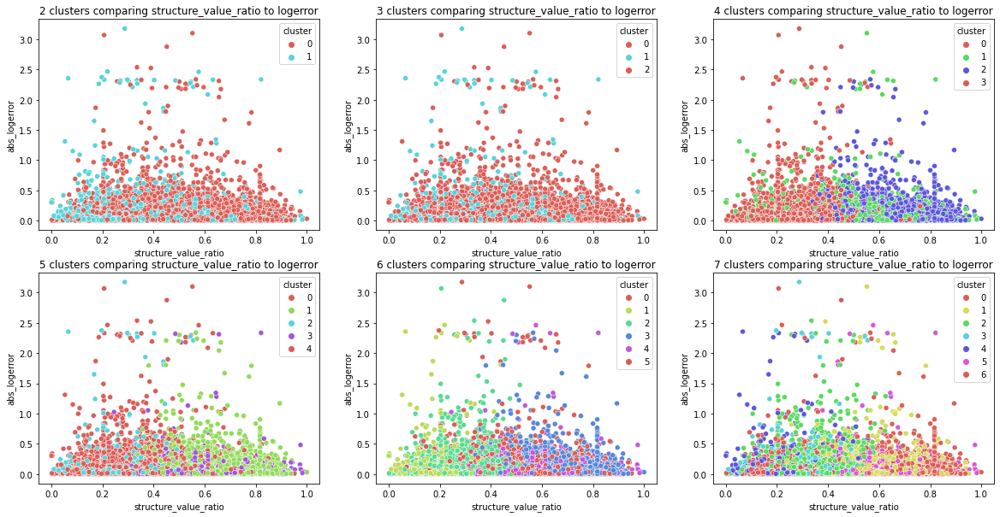

In [20]:
for col in df_clustering2.columns:
    print(f'----------\n\n {col} vs logerror clustering:\n')
    plt.figure(figsize = (20,10))
    for k in range(2,8):
        plt.subplot(2,3,k-1)
        cluster = pd.concat([df_clustering2[col],train.abs_logerror],axis=1)
        kmeans = KMeans(n_clusters = k)
        kmeans.fit(df_clustering2)
        cluster['cluster'] = kmeans.predict(df_clustering2)       
        plt.title(f'{k} clusters comparing {col} to logerror')
        sns.scatterplot(data = cluster, x = cluster[col], y = train.abs_logerror, hue='cluster', palette='hls')
        cluster = cluster.drop(columns='cluster')
    plt.show()

compare all to logerror, multiple ks

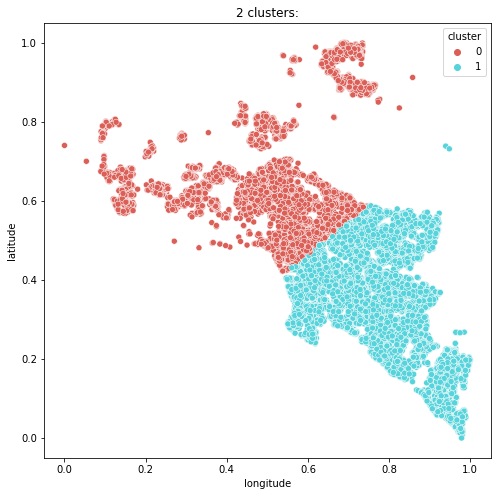


--------------------



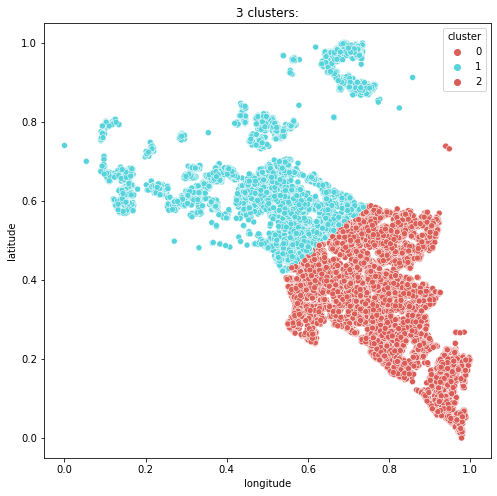


--------------------



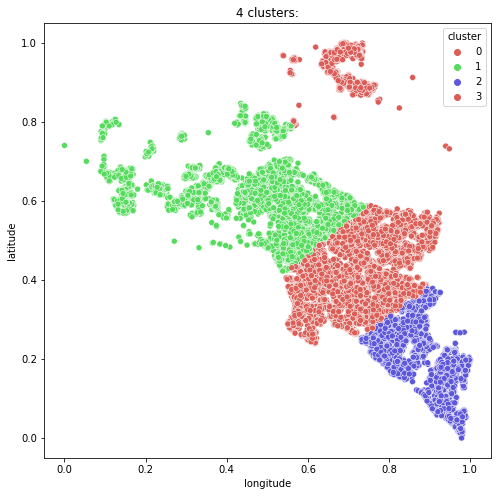


--------------------



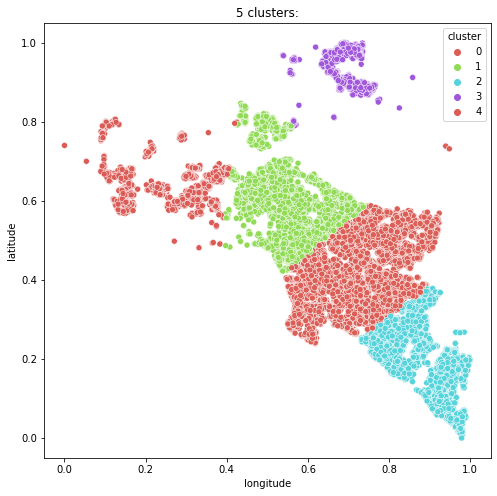


--------------------



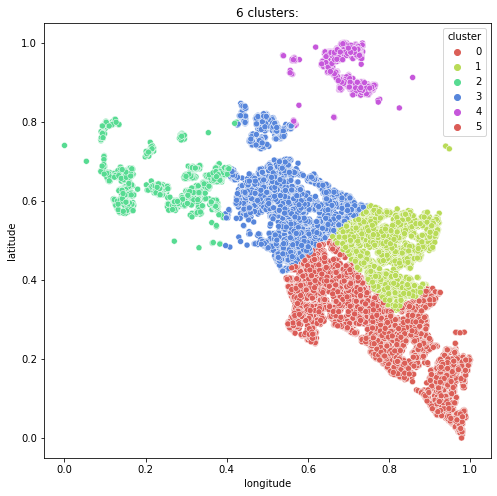


--------------------



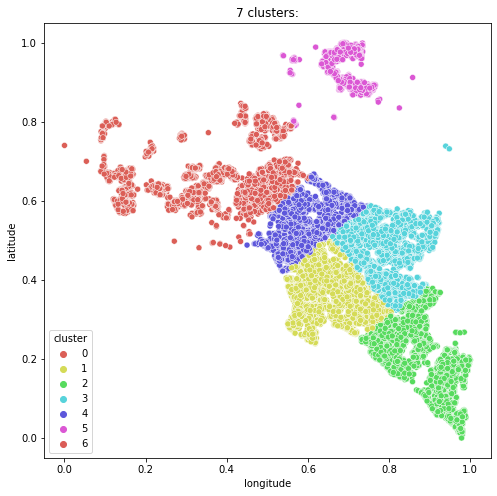


--------------------



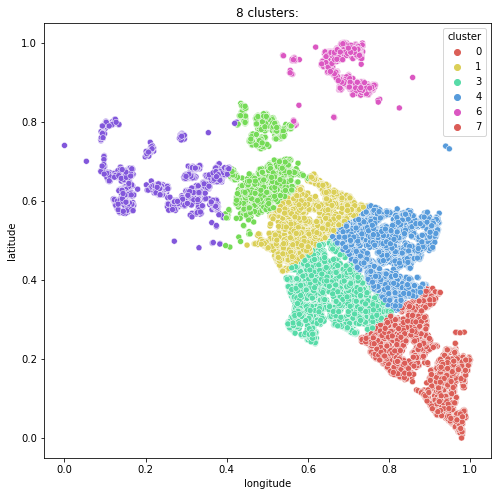


--------------------



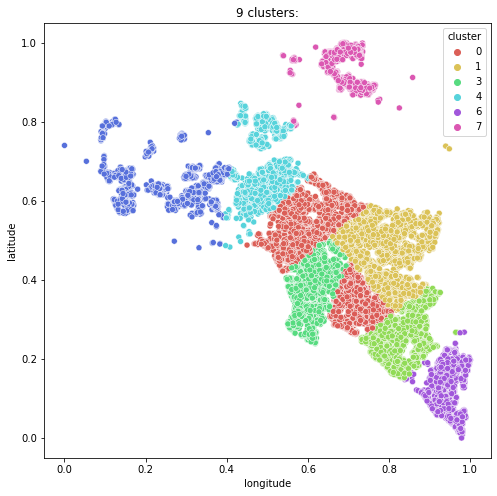


--------------------



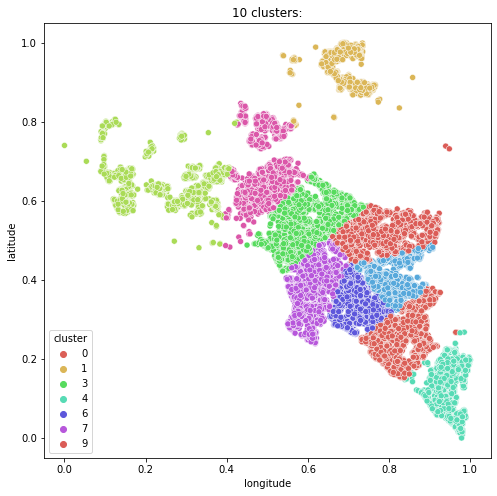


--------------------



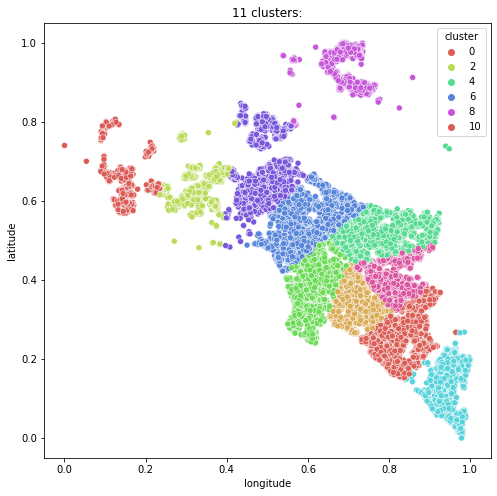


--------------------



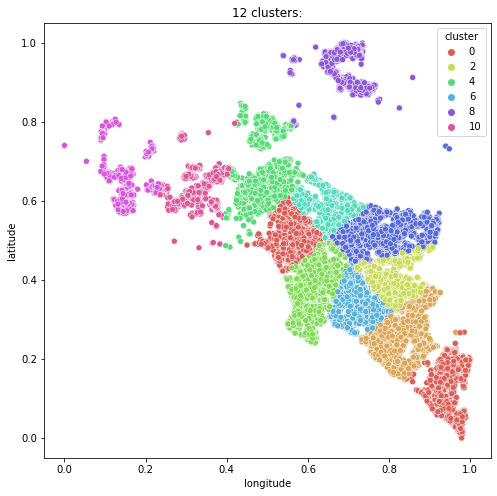


--------------------



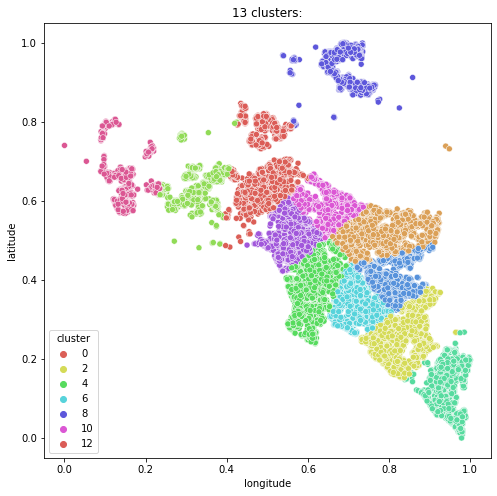


--------------------



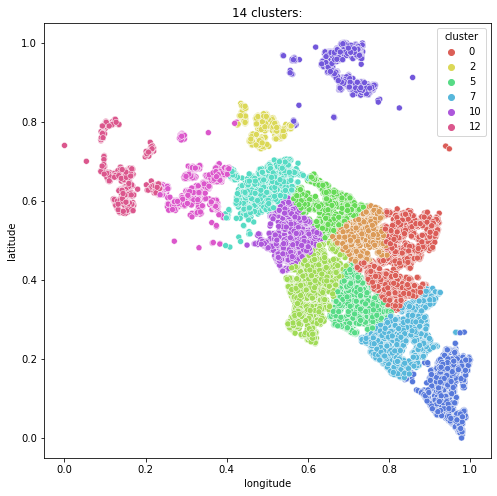


--------------------



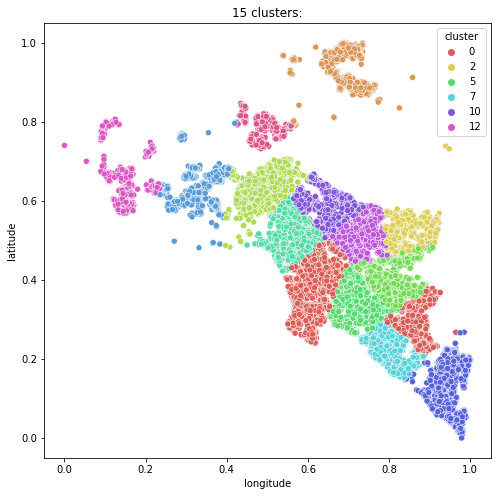


--------------------



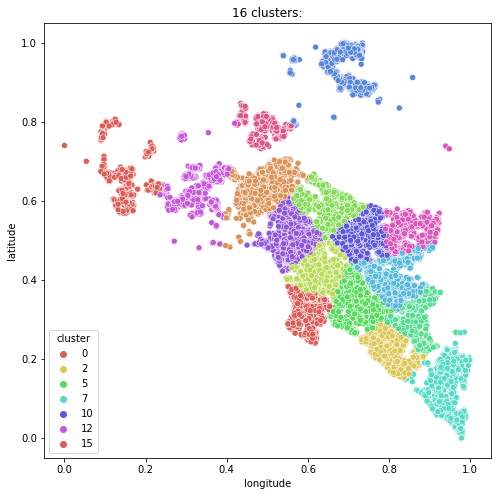


--------------------



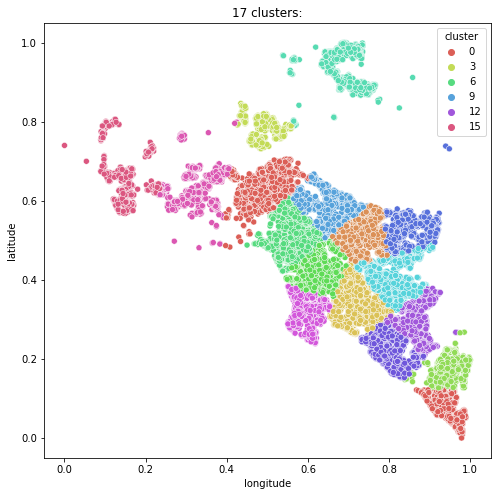


--------------------



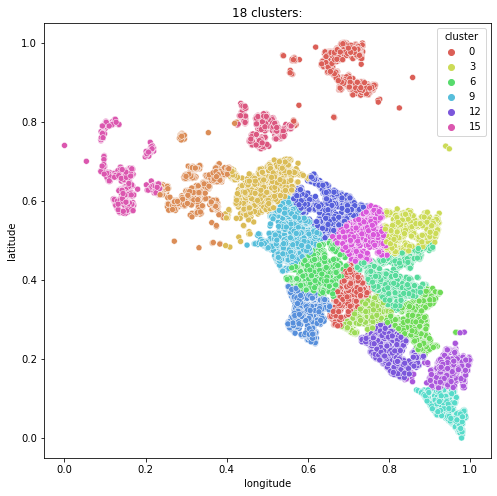


--------------------



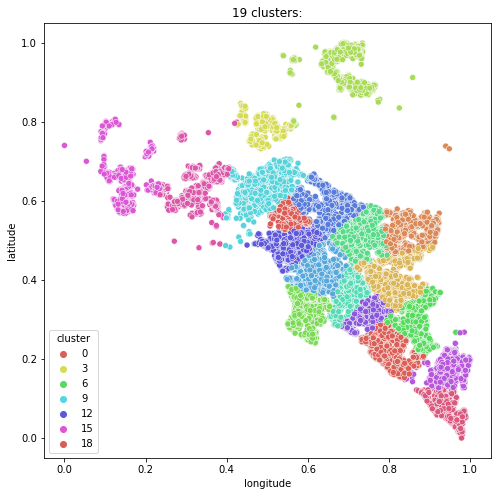


--------------------



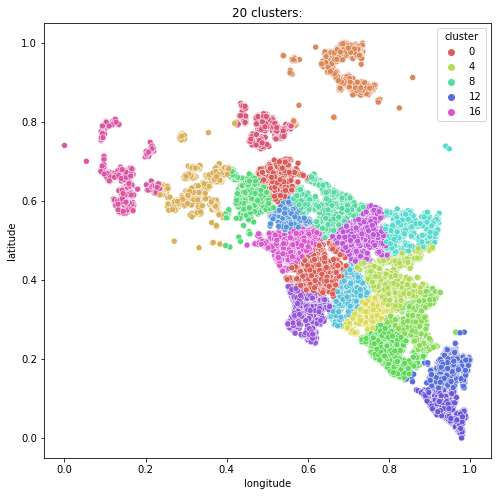


--------------------



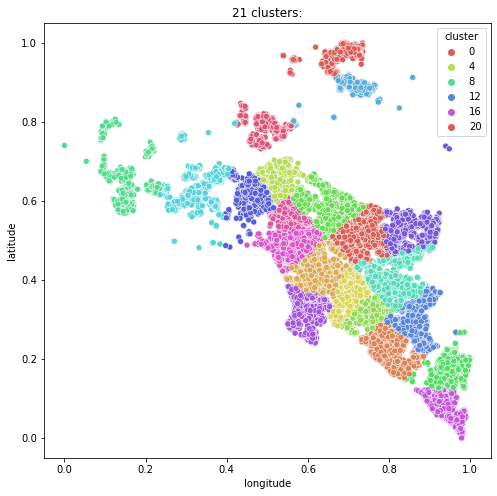


--------------------



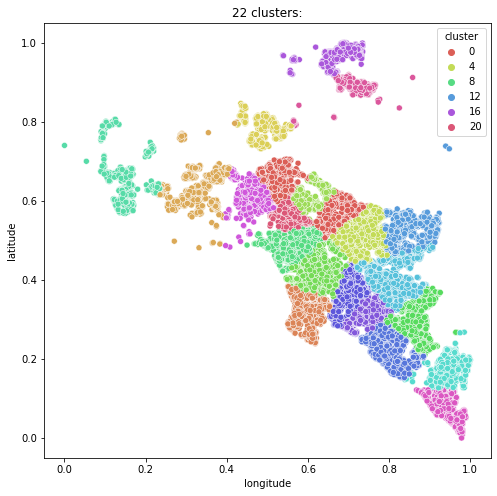


--------------------



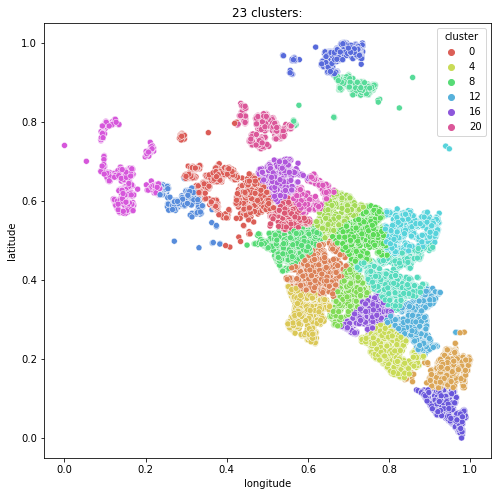


--------------------



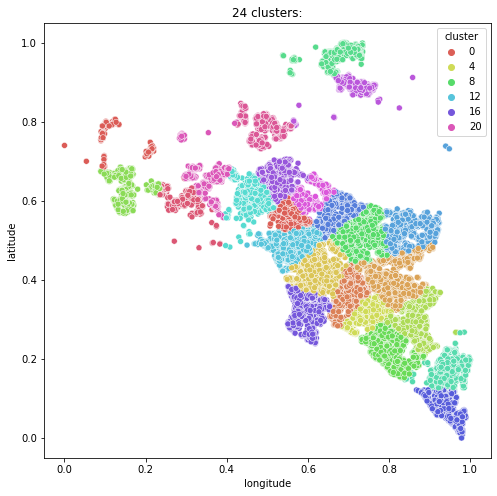


--------------------



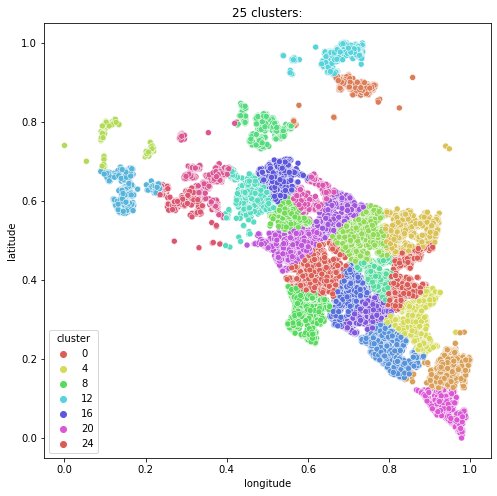


--------------------



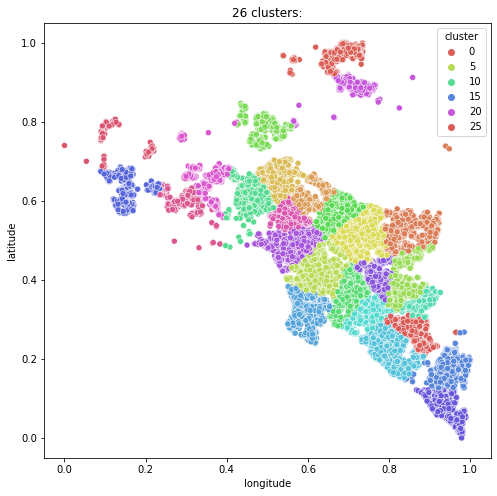


--------------------



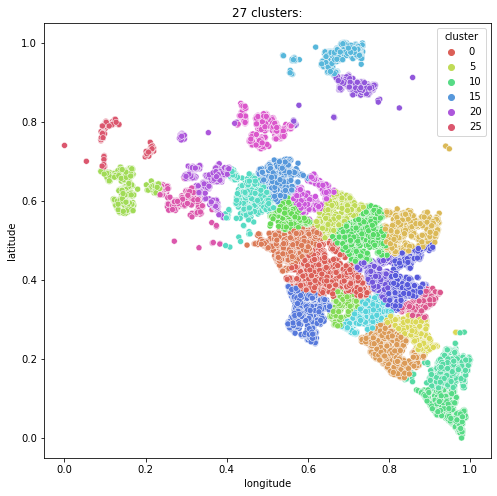


--------------------



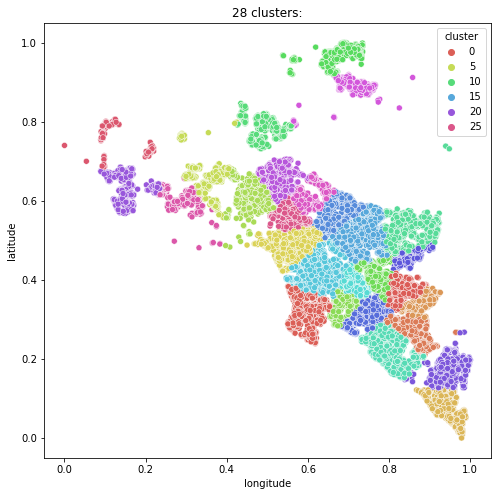


--------------------



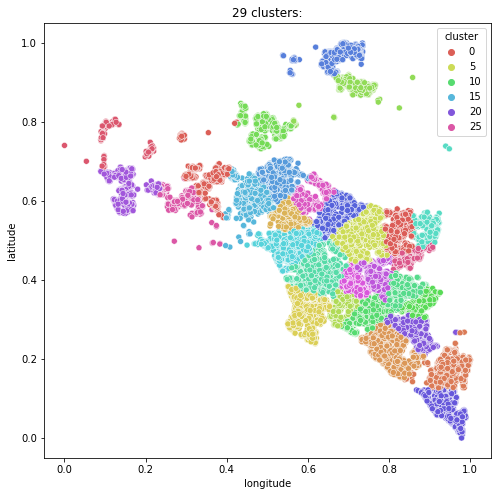


--------------------



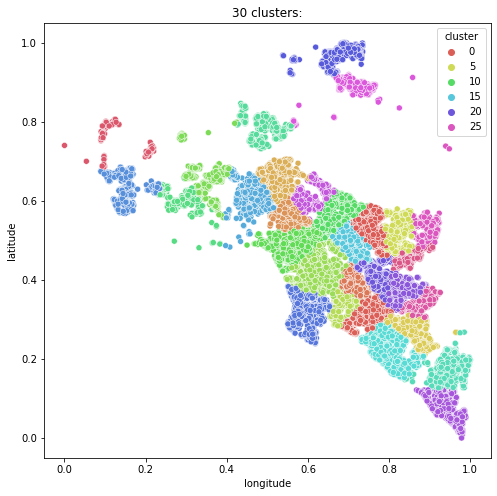


--------------------



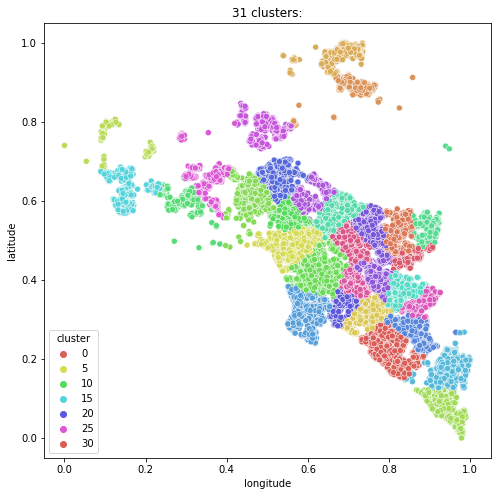


--------------------



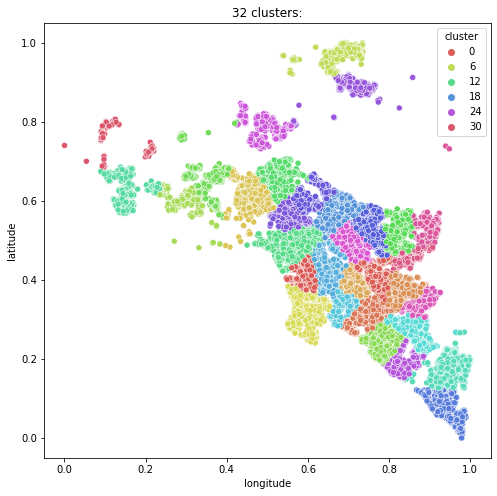


--------------------



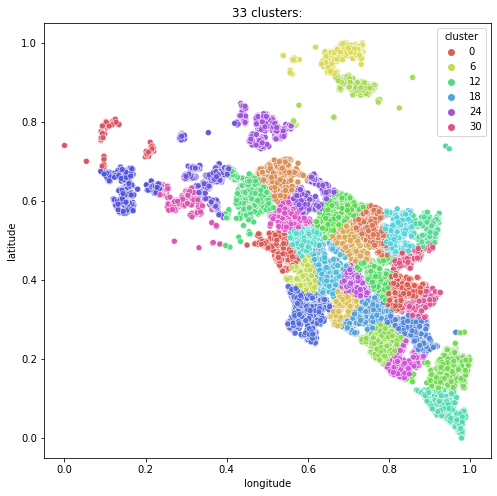


--------------------



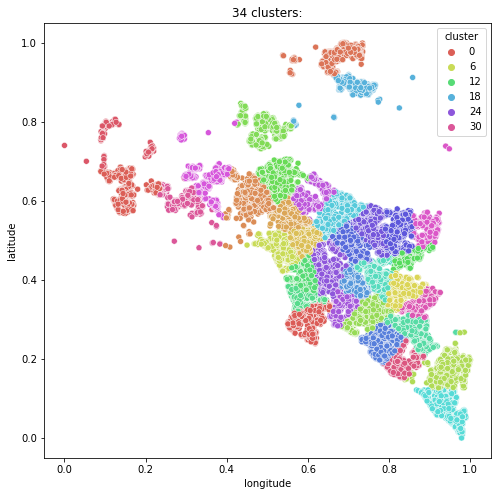


--------------------



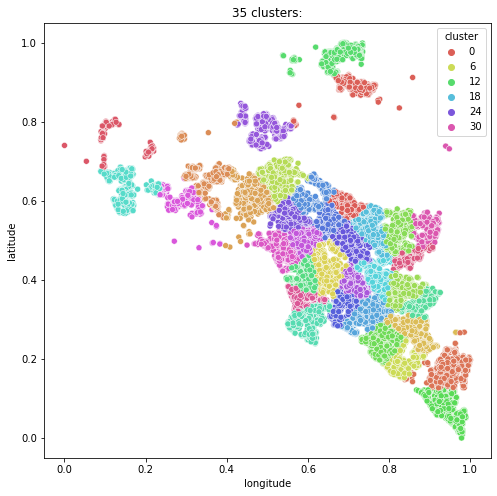


--------------------



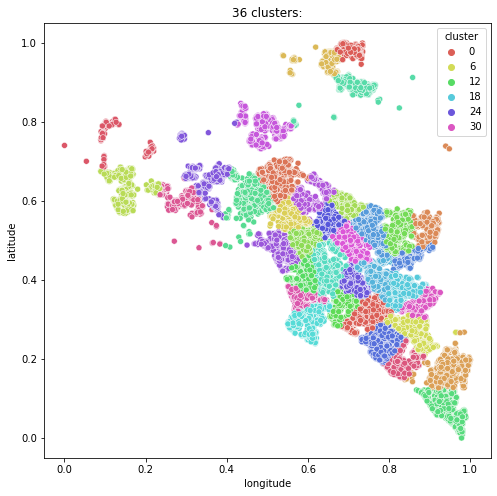


--------------------



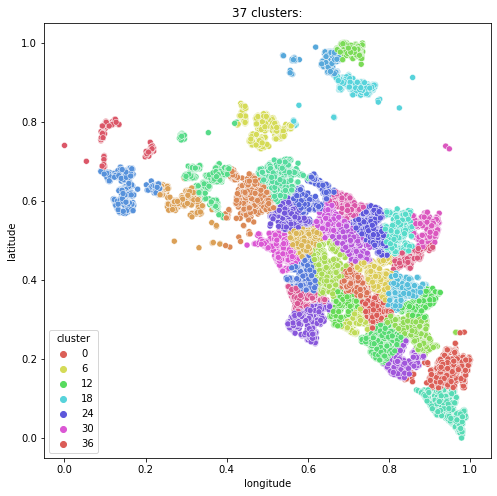


--------------------



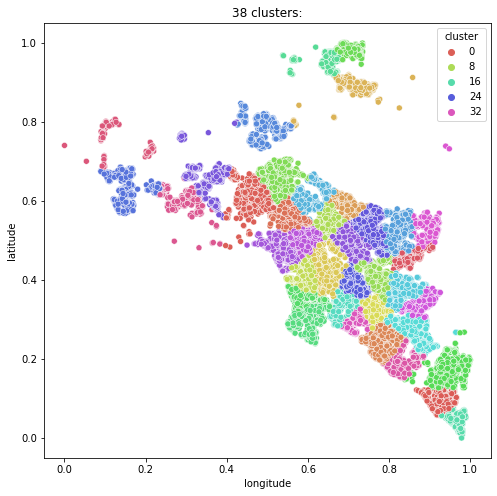


--------------------



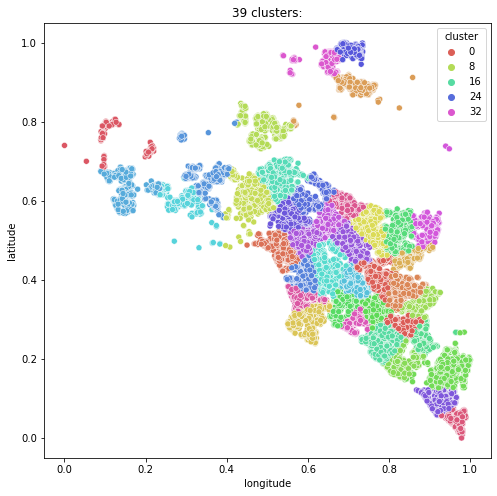


--------------------



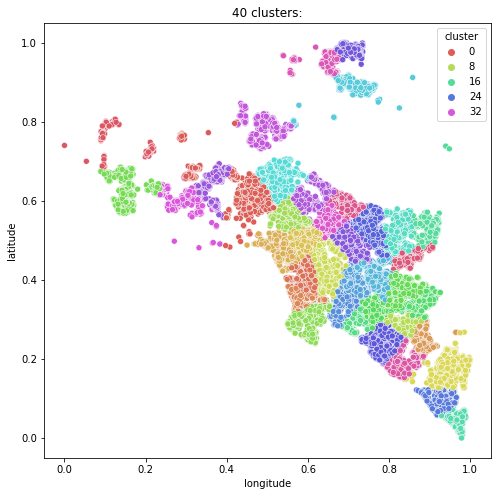


--------------------



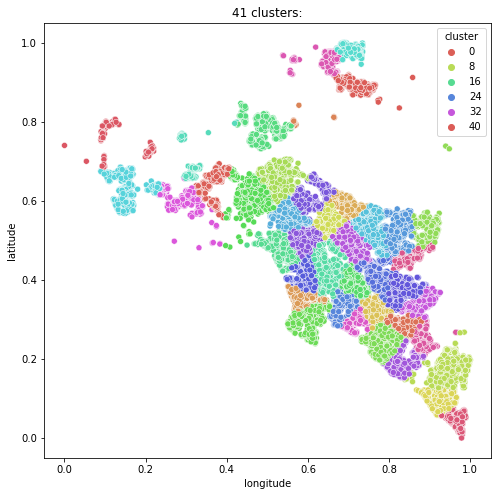


--------------------



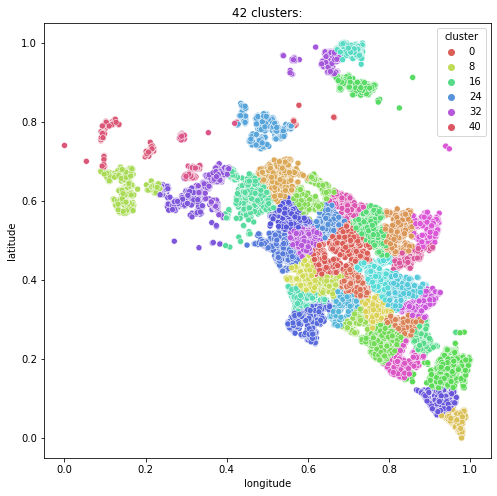


--------------------



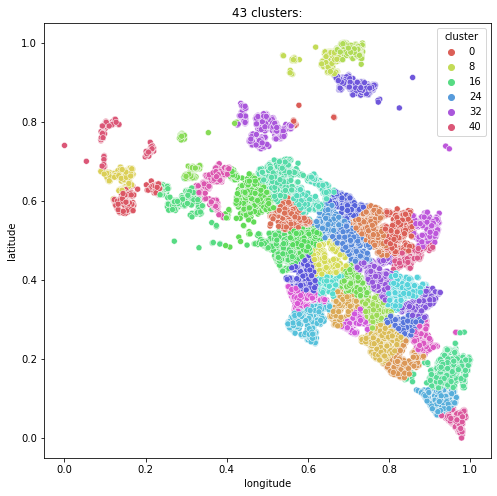


--------------------



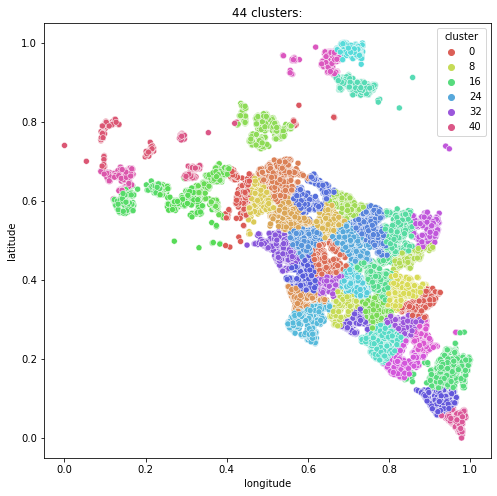


--------------------



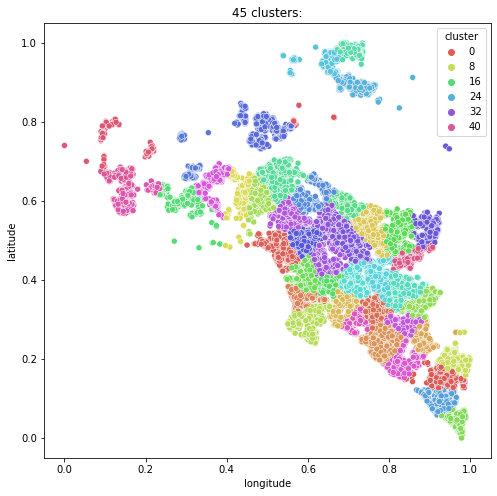


--------------------



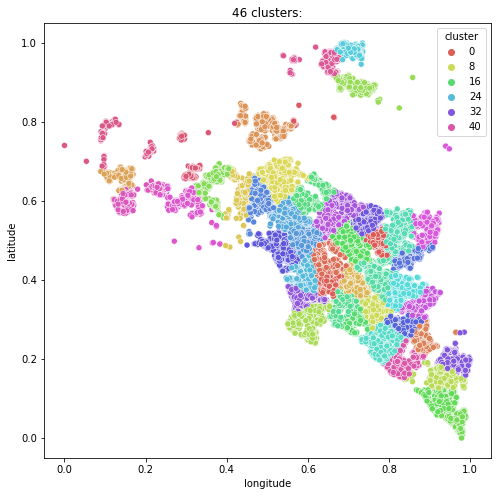


--------------------



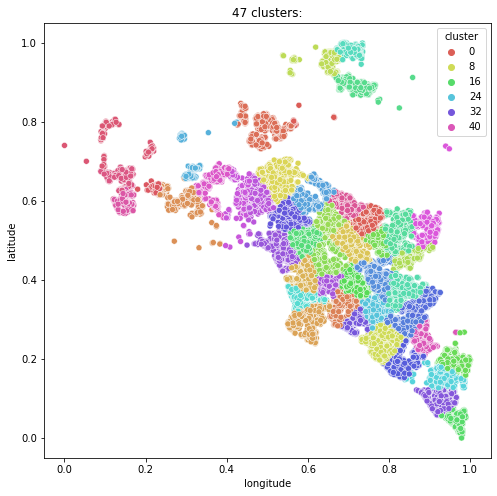


--------------------



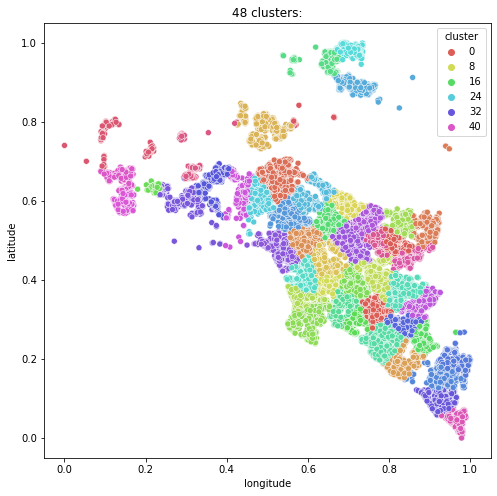


--------------------



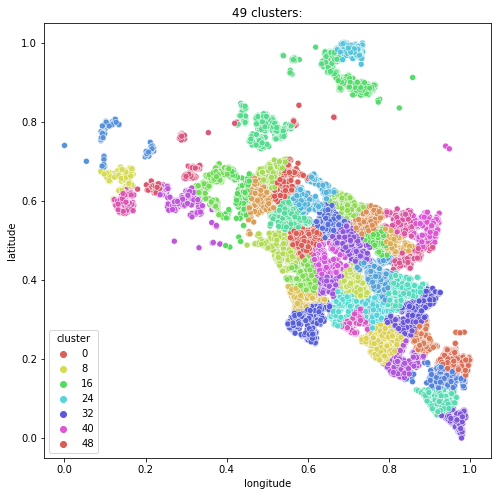


--------------------



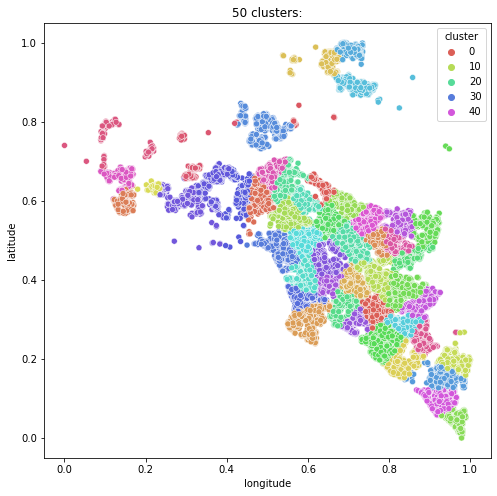


--------------------



In [21]:
df_to_scale3 = train[['latitude','longitude']]
scaler = MinMaxScaler()
scaler.fit(df_to_scale3)

df_geo = pd.DataFrame(scaler.transform(df_to_scale3),columns=df_to_scale3.columns.values).set_index([df_to_scale3.index.values])

for k in range(2,51):
    cluster = df_geo
    kmeans = KMeans(n_clusters = k)
    kmeans.fit(cluster)
    cluster['cluster'] = kmeans.predict(cluster)
    plt.figure(figsize = (8,8))
    plt.title(f'{k} clusters:')
    sns.scatterplot(data = cluster, x = 'longitude', y = 'latitude', hue='cluster', palette='hls')
    plt.show()
    cluster = cluster.drop(columns='cluster')
    print('\n--------------------\n')

Now I am going to run a wild thing - elbow test:

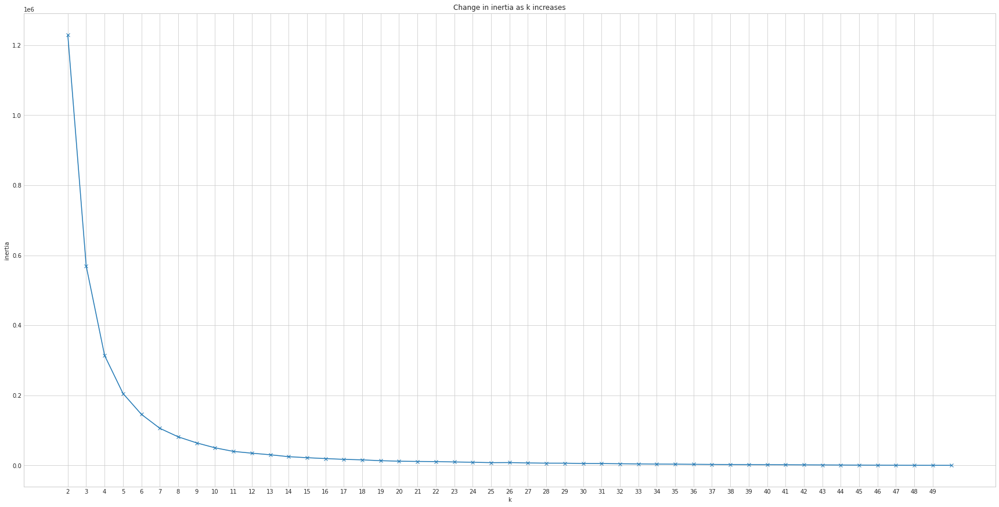

In [22]:
with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(30, 15))
    pd.Series({k: KMeans(k).fit(df_geo).inertia_ for k in range(2, 51)}).plot(marker='x')
    plt.xticks(range(2, 50))
    plt.xlabel('k')
    plt.ylabel('inertia')
    plt.title('Change in inertia as k increases')

In [23]:
df_to_scale2.head()

,salesvalue,geo_sales_value_y,structurevalue,geo_sales_value_x,taxamount,sqft,lotsize,landvalue,yearbuilt,structure_value_ratio
42213,704060,0.888728,287636,667083.621622,7930,2438,6650,416424,2000,0.408539
19936,1041905,0.818651,344232,585553.208333,10754,3656,8050,697673,1989,0.330387
39092,416000,0.243805,82000,281014.295833,5334,1112,5167,334000,1953,0.197115
14951,91701,0.441323,65836,388352.927126,1475,2174,7837,25865,1954,0.717942
106,1110474,0.931793,336053,723969.190698,11928,2320,2550,774421,2000,0.302621


[('salesvalue', 'geo_sales_value_y'), ('salesvalue', 'structurevalue'), ('salesvalue', 'geo_sales_value_x'), ('salesvalue', 'taxamount'), ('salesvalue', 'sqft'), ('salesvalue', 'lotsize'), ('salesvalue', 'landvalue'), ('salesvalue', 'yearbuilt'), ('salesvalue', 'structure_value_ratio'), ('geo_sales_value_y', 'structurevalue'), ('geo_sales_value_y', 'geo_sales_value_x'), ('geo_sales_value_y', 'taxamount'), ('geo_sales_value_y', 'sqft'), ('geo_sales_value_y', 'lotsize'), ('geo_sales_value_y', 'landvalue'), ('geo_sales_value_y', 'yearbuilt'), ('geo_sales_value_y', 'structure_value_ratio'), ('structurevalue', 'geo_sales_value_x'), ('structurevalue', 'taxamount'), ('structurevalue', 'sqft'), ('structurevalue', 'lotsize'), ('structurevalue', 'landvalue'), ('structurevalue', 'yearbuilt'), ('structurevalue', 'structure_value_ratio'), ('geo_sales_value_x', 'taxamount'), ('geo_sales_value_x', 'sqft'), ('geo_sales_value_x', 'lotsize'), ('geo_sales_value_x', 'landvalue'), ('geo_sales_value_x', 'ye

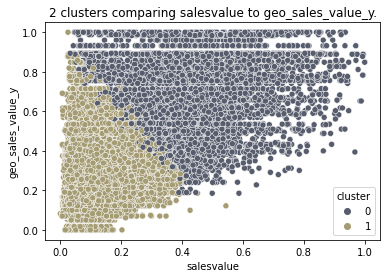

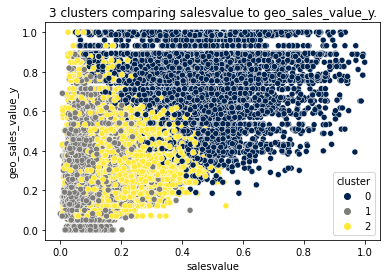

----------

 salesvalue vs structurevalue clustering:



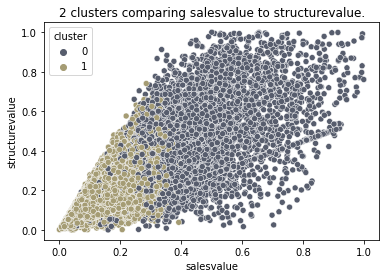

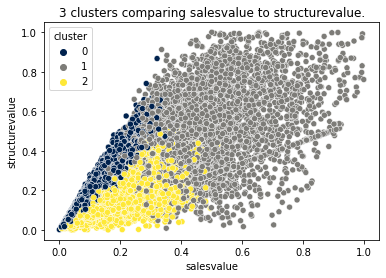

----------

 salesvalue vs geo_sales_value_x clustering:



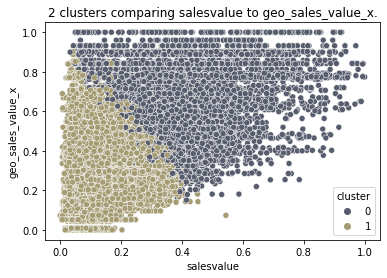

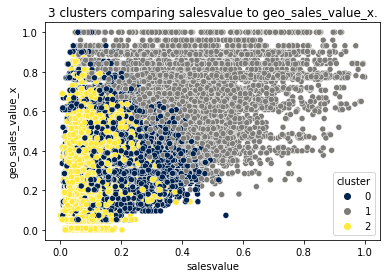

----------

 salesvalue vs taxamount clustering:



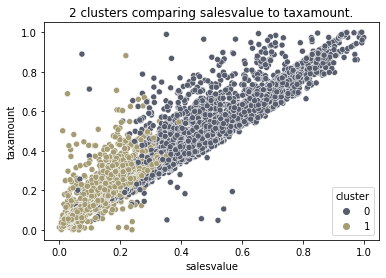

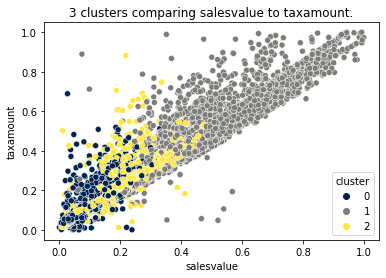

In [24]:
# Limited this to just first 4 features (6 combos) as well as using only k of 2 & 3
# Original analysis ran all combos and k from 2 through 6

cluster_inputs = list(combinations(features,2))
print(cluster_inputs)

df_to_scale2 = train[features]
scaler = MinMaxScaler()
scaler.fit(df_to_scale2)

df_scaled = pd.DataFrame(scaler.transform(df_to_scale2),columns=df_to_scale2.columns.values).set_index([df_to_scale2.index.values])
print(df_scaled)
for combo in cluster_inputs[0:4]:
    print(f'----------\n\n {combo[0]} vs {combo[1]} clustering:\n')
    for k in range(2,4):
        cluster = df_scaled[list(combo)]
        kmeans = KMeans(n_clusters = k)
        kmeans.fit(df_scaled)
        cluster['cluster'] = kmeans.predict(df_scaled)       
        plt.title(f'{k} clusters comparing {combo[0]} to {combo[1]}.')
        sns.scatterplot(data = cluster, x = cluster[combo[0]], y = cluster[combo[1]], hue='cluster', palette='cividis')
        cluster = cluster.drop(columns='cluster')
        plt.show()

##### Question I have - check to see if propertyvalue = land + building values

In [25]:
ghost = df[['structurevalue','landvalue','salesvalue']]
ghost.head(2)

,structurevalue,landvalue,salesvalue
0,485713,537569,1023282
1,296609,1144643,1441252


In [26]:
ghost['calcpropvalue'] = ghost.landvalue + ghost.structurevalue
ghost['check'] = (ghost['salesvalue']-ghost['calcpropvalue'])
ghost.check.sum()

0

Today I learned that propertyvalue is always building plus land value!

### Going back to EDA, here is my attempt to use transaction date {use clustering in an attempt to create bins that have some sort of greater value}.  Otherwise it will be dropped!

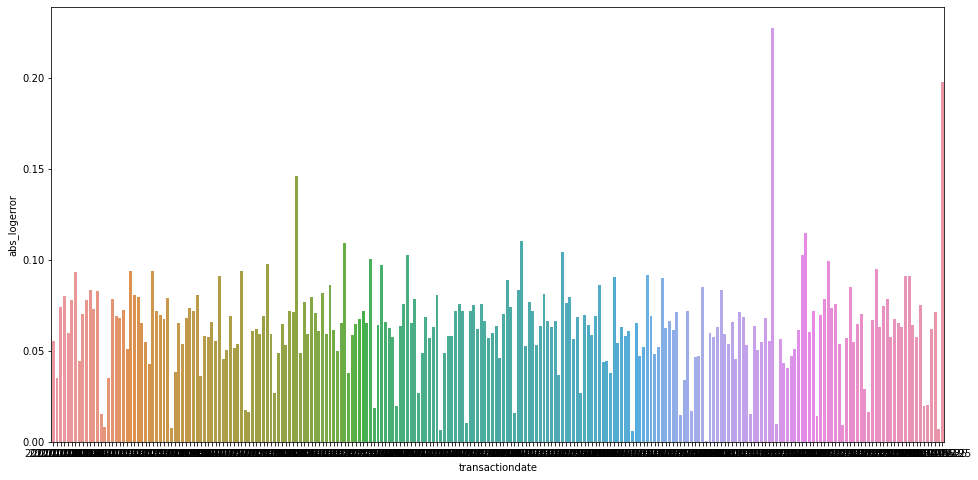

In [27]:
date_analys = train[['transactiondate','abs_logerror']]

date_analys = pd.DataFrame(date_analys.groupby('transactiondate').abs_logerror.mean())

date_analys.head(12)

plt.figure(figsize = (16,8))
sns.barplot(x=date_analys.index,y=date_analys['abs_logerror'])
plt.show()
#sns.histplot(date_analys,x =kde=True)

#da = date_analys.groupby('transactiondate').logerror.count()
#db = date_analys['da']

#date_analys.head()
#date_analys
#db = date_analys.groupby('transactiondate').abs_logerror.sum()

#### This doesn't give me much insight into anything where transaction date could be impactful, especailly since most home sales are not fast purchases - they should't vary much by month.

### Need to do this to price as well!

In [28]:
# df['taxpv'] = df.taxamount/df.propertyvalue
# df['taxbv'] = df.taxamount/df.buildingvalue
# df['taxlv'] = df.taxamount/df.landvalue
# df['calctv'] = 1/((1/df.taxbv)+(1/df.taxlv))
# df[['taxamount','propertyvalue','buildingvalue','landvalue','taxpv','taxbv','taxlv','county']].sample(25)

#### Is there a difference between building value and land value when it comes to logerror?

In [29]:
# plt.figure(figsize = (16,8))
# sns.histplot(data = df[df['taxpv']<.5], x = 'taxpv')
# sns.histplot(data = df[df['taxbv']<.5], x = 'taxbv', color='red')
# sns.histplot(data = df[df['taxlv']<.5], x = 'taxlv', color='yellow')
# plt.show()

### *Interesting sidenote - make sure you delete your cluster columns between each iteration as they influence the following cluster!  ALTHOUGH - could this be something that improves a model?  Or maybe you can reverse it, or k means of means?*

### Also important to mention: When you have dense, noisy data like this, it's often hard to use these clusters for much more than infomational, rather than modeling purposes.  I.e. direct models using them are not nearly as helpful as the feaures they help engineer (cluster features)